Geothermal machine learning analysis: Southwest New Mexico 
---

This notebook is a part of the GTcloud.jl: GeoThermal Cloud for Machine Learning.

<div style="text-align: left; padding-bottom: 30px;">
    <img src="../../logos/geothermalcloud-small.png" alt="geothermalcloud" width=25%  max-width=125px;/>
</div>

Machine learning analyses are performed using the **SmartTensors** machine learning framework.

<div style="text-align: left; padding-bottom: 30px;">
	<img src="../../logos/SmartTensorsNewSmaller.png" alt="SmartTensors" width=25%  max-width=125px;/>
</div>

This notebook demonstrates how the **NMFk** module of **SmartTensors** can be applied to perform unsupervised geothermal machine-learning analyses.

<div style="text-align: left; padding-bottom: 30px;">
	<img src="../../logos/nmfk-logo.png" alt="nmfk" width=25%  max-width=125px;/>
</div>

More information how the ML results are interpreted to provide geothermal insights is discussed in our research paper.

## Import required libraries for this work

If **NMFk** is not installed, first execute in the Julia REPL `import Pkg; Pkg.add("NMFk"); Pkg.add("DelimitedFiles"); Pkg.add("JLD"); Pkg.add("Gadfly"); Pkg.add("Cairo"); Pkg.add("Fontconfig"); Pkg.add("Mads")`.

In [1]:
import NMFk
import DelimitedFiles
import JLD
import Gadfly
import Cairo
import Fontconfig
import Mads

## Load and pre-process the data

### Setup the working directory containing the SWNM data

In [2]:
cd("/Users/vvv/Julia/GTcloud-SmartTensors.jl/SWNM");

### Load the data file

In [3]:
d, h = DelimitedFiles.readdlm("data/Pepin_PCA_Input_Data_LANL.csv", ','; header=true);

### Define names of the data attributes (matrix columns)

In [4]:
attributes_short = ["Boron"; "Gravity"; "Magnetic"; "Dikes"; "Drainage"; "FaultInter"; "QuatFaults"; "Seismicity"; "NMFaults"; "Springs"; "Vents"; "Lithium"; "Precip"; "Air_Temp"; "Silica"; "Subcrop"; "WT_Gradient"; "WT_Elev"; "Heatflow"; "GS_Elev"; "DTW"; "Crst_Thick"; "Bsmt_Depth"]
attributes_long = uppercasefirst.(lowercase.(["Boron Concentration"; "Gravity Anomaly"; "Magnetic Intensity"; "Volcanic Dike Density"; "Drainage Density"; "Fault Intersection Density"; "Quaternary Fault Density"; "Seismicity"; "State Map Fault Density"; "Spring Density"; "Volcanic Vent Density"; "Lithium Concentration"; "Precipitation"; "Air Temperature"; "Silica Geothermometer"; "Subcrop Permeability"; "Hydraulic Gradient"; "Watertable Elevation"; "Heat flow"; "Groundsurface Elevation"; "Watertable Depth"; "Crustal Thickness"; "Depth to Basement"]))
attributes_long_new = uppercasefirst.(lowercase.(["Boron"; "Gravity anomaly"; "Magnetic intensity"; "Volcanic dike density"; "Drainage density"; "Fault intersection density"; "Quaternary fault density"; "Seismicity"; "State map fault density"; "Spring density"; "Volcanic vent density"; "Lithium"; "Precipitation"; "Air temperature"; "Silica geothermometer"; "Subcrop permeability"; "Hydraulic gradient"; "Watertable elevation"; "Heat flow"; "Groundsurface elevation"; "Watertable depth"; "Crustal thickness"; "Depth to basement"]))
attributes_ordered = ["Boron concentration", "Lithium concentration", "Drainage density", "Spring density", "Hydraulic gradient", "Precipitation", "Gravity anomaly", "Magnetic intensity", "Seismicity", "Silica geothermometer", "Heat flow", "Crustal thickness", "Depth to basement", "Fault intersection density", "Quaternary fault density", "State map fault density", "Volcanic dike density", "Volcanic vent density"];

Short attribute names are used for coding.

Long attribute names are used for plotting and visualization.

### Define attributes to remove from analysis

In [5]:
attributes_remove = uppercasefirst.(lowercase.(["Air Temperature"; "Subcrop Permeability"; "Watertable Elevation"; "Groundsurface Elevation"; "Watertable Depth"]));

### Define attributes for analysis

In [6]:
index_remove = indexin(attributes_remove, attributes_long)
attributes_cols = trues(length(attributes_long))
attributes_cols[index_remove] .= false
cols = vec(4:26)[attributes_cols]
attributes = attributes_long[cols .- 3];

### Define names of the data locations

In [7]:
locations_short = ["Alamos spr";
"Allen spr";
"Apache well";
"Aragon spr";
"Ash spr";
"B.Iorio well";
"Cliff spr";
"Dent well";
"Derry spr";
"Faywood spr";
"Fed H1 well";
"Freiborn spr";
"Garton well";
"Gila spr 1";
"Gila spr 2";
"Goat spr";
"Jerry well";
"Kennecott well";
"Laguna Pbl";
"Lightning Dock";
"Los Alturas";
"Mangas spr";
"Mimbres spr";
"Ojitos spr";
"Ojo Caliente";
"Ojo Canas";
"Pueblo well";
"Radium spr";
"Rainbow spr";
"Riverside well";
"Sacred spr";
"Socorro Can";
"Spring";
"Spring Can";
"T or C spr";
"Turkey spr";
"Victoria well";
"Warm spr";
"Well 1";
"Well 2";
"Well 3";
"Well 4";
"Well 5";
"Carne well"]

locations_long = ["Alamos Spring";
"Allen Springs";
"Apache Tejo Warm Springs well";
"Aragon Springs";
"Ash Spring";
"B. Iorio 1 well";
"Cliff Warm Spring";
"Dent windmill well";
"Derry Warm Springs";
"Faywood Hot Springs";
"Federal H 1 well";
"Freiborn Canyon Spring";
"Garton well";
"Gila Hot Springs 1";
"Gila Hot Springs 2";
"Goat Camp Spring";
"Jerry well";
"Kennecott Warm Springs well";
"Laguna Pueblo";
"Lightning Dock";
"Los Alturas Estates";
"Mangas Springs";
"Mimbres Hot Springs";
"Ojitos Springs";
"Ojo Caliente";
"Ojo De las Canas";
"Pueblo windmill well";
"Radium Hot Springs";
"Rainbow Spring";
"Riverside Store well";
"Sacred Spring";
"Socorro Canyon";
"Spring";
"Spring Canyon Warm Spring";
"Truth or Consequences spring";
"Turkey Creek Spring";
"Victoria Land and Cattle Co. well";
"Warm Springs";
"Well 1";
"Well 2";
"Well 3";
"Well 4";
"Well 5";
"Well south of Carne"];

Short location names are used for coding.

Long location names are used for plotting and visualization.

### Define location coordinates

In [8]:
dindex = d[:,end] .== 1
rows = convert.(Int32, d[dindex,end-1])
locations = locations_short[rows]
lat = d[dindex, 2]
lon = d[dindex, 3];

### Set up directories tp store results and figures

In [9]:
figuredir = "figures-case01"
resultdir = "results-case01";

### Define a range for number of signatures to be explored 

In [10]:
nkrange = 2:10;

### Define and normalize the data matrix

In [11]:
X = permutedims(d[dindex, cols])
Xu, nmin, nmax = NMFk.normalizematrix_row!(X);

## Perform ML analyses

The **NMFk** algorithm factorizes the normalized data matrix `Xu` into `W` and `H` matrices. For more information, check out the [**NMFk** website](https://github.com/SmartTensors/NMFk.jl)

In [12]:
W, H, fitquality, robustness, aic = NMFk.execute(Xu, nkrange, 1000; resultdir=resultdir, casefilename="nmfk", load=true)
W, H, fitquality, robustness, aic = NMFk.load(nkrange, 1000; resultdir=resultdir, casefilename="nmfk");

Signals:  2 Fit:     32.70151 Silhouette:            1 AIC:    -2276.215
Signals:  3 Fit:      24.6022 Silhouette:    0.9999996 AIC:    -2377.607
Signals:  4 Fit:     18.46274 Silhouette:    0.9999994 AIC:    -2480.975
Signals:  5 Fit:     14.74592 Silhouette:     0.764538 AIC:    -2535.007
Signals:  6 Fit:      12.3538 Silhouette:   -0.1423047 AIC:    -2551.193
Signals:  7 Fit:     10.29325 Silhouette:   -0.0733191 AIC:    -2571.714
Signals:  8 Fit:     8.237522 Silhouette:    0.2518114 AIC:    -2624.163
Signals:  9 Fit:     7.607165 Silhouette:  -0.07981342 AIC:    -2563.213
Signals: 10 Fit:     6.023938 Silhouette:   0.02130362 AIC:    -2624.026
Signals:  2 Fit:     32.70151 Silhouette:            1 AIC:    -2276.215
Signals:  3 Fit:      24.6022 Silhouette:    0.9999996 AIC:    -2377.607
Signals:  4 Fit:     18.46274 Silhouette:    0.9999994 AIC:    -2480.975
Signals:  5 Fit:     14.74592 Silhouette:     0.764538 AIC:    -2535.007
Signals:  6 Fit:      12.3538 Silhouette:   -0.1423

Here, the **NMFk** results are loaded from a prior ML runs.

As seen from the output above, the NMFk analyses identified that the optimal number of geothermal signatures in the dataset **8**.

Solutions with a number of signatures less than **8** are underfitting.

Solutions with a number of signatures greater than **8** are overfitting and unacceptable.

The set of accetable solutions are defined as follows:

In [13]:
NMFk.getks(nkrange, robustness[nkrange])

5-element Array{Int64,1}:
 2
 3
 4
 5
 8

The accceptable solutions contain 2, 3, 4, 5 and 8 signatures.

### Post-process NMFk results

Plot representing solution quality (fit) and silhouette width (robustness) for different number of sigantures `k`:

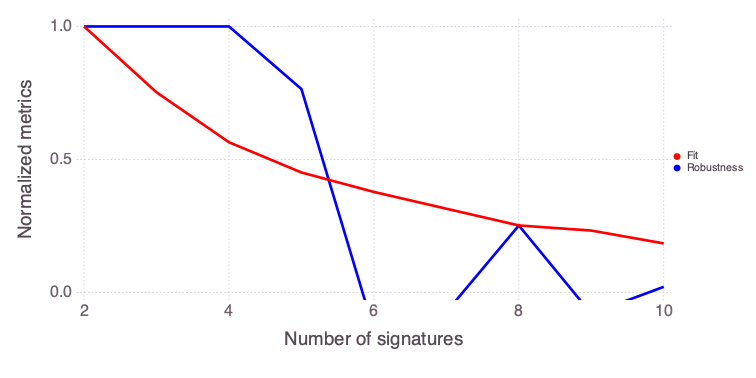

In [14]:
NMFk.plot_signal_selecton(nkrange, fitquality, robustness; figuredir=figuredir, xtitle="Number of signatures")

The ML solutions containing an acceptable number of signatures are further analyzed as follows:

Signal importance (high->low): [1, 2]
┌ Info: Number of signals: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697


29×2 Array{Any,2}:
 "Allen spr"       1.0
 "Turkey spr"      0.884139
 "Aragon spr"      0.849368
 "Gila spr 1"      0.845807
 "Ash spr"         0.839107
 "Gila spr 2"      0.829838
 "Garton well"     0.788626
 "Mimbres spr"     0.7852
 "Ojitos spr"      0.76979
 "Socorro Can"     0.761215
 "Freiborn spr"    0.745613
 "Well 1"          0.743076
 "Spring Can"      0.741828
 ⋮                 
 "Warm spr"        0.676919
 "Cliff spr"       0.676442
 "Ojo Caliente"    0.670285
 "Spring"          0.669871
 "Alamos spr"      0.64752
 "Pueblo well"     0.63547
 "Rainbow spr"     0.635234
 "Jerry well"      0.622338
 "Laguna Pbl"      0.601675
 "Sacred spr"      0.597838
 "Apache well"     0.563514
 "Kennecott well"  0.510178

15×2 Array{Any,2}:
 "Fed H1 well"     1.0
 "Well 4"          0.840281
 "Well 2"          0.78384
 "Well 5"          0.719246
 "Los Alturas"     0.692025
 "Radium spr"      0.687742
 "Lightning Dock"  0.677317
 "T or C spr"      0.60486
 "Carne well"      0.592351
 "Well 3"          0.56113
 "B.Iorio well"    0.480433
 "Victoria well"   0.462937
 "Derry spr"       0.400573
 "Faywood spr"     0.391769
 "Goat spr"        0.354929

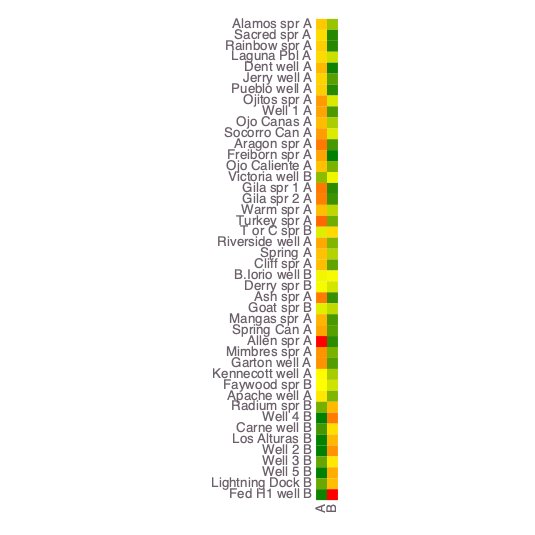

┌ Info: Robust k-means analysis results are loaded from file results-case01/Hmatrix-2-2_44-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-case01/Wmatrix-2-2_18-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Info: Signal A -> A Count: 29
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 15
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S

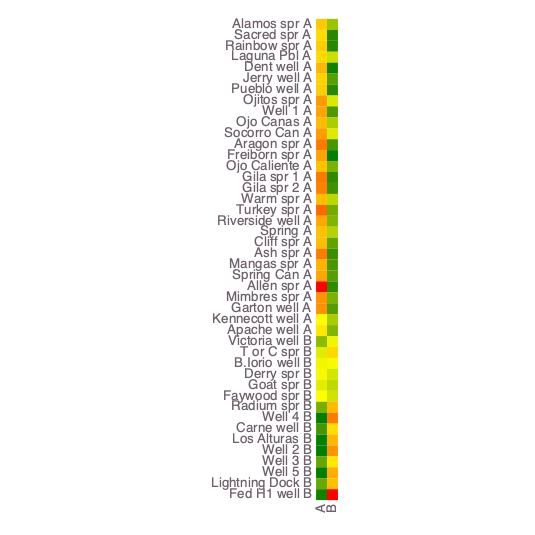

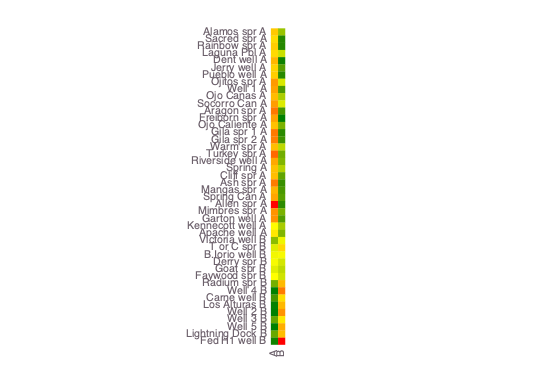

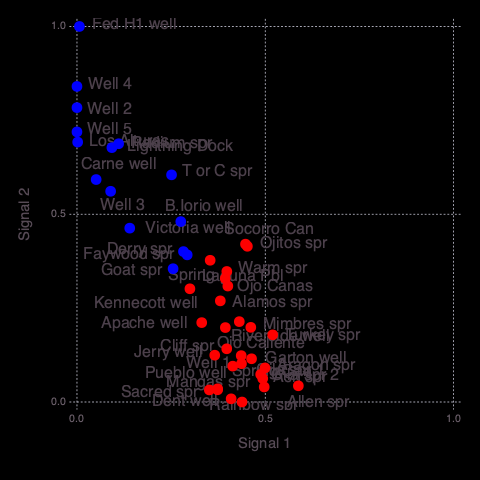

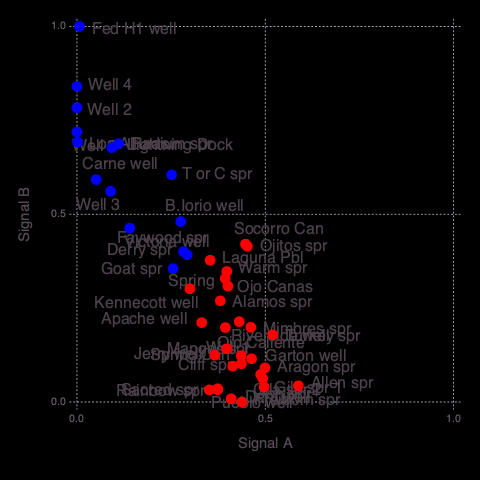

11×2 Array{Any,2}:
 "Drainage density"            1.0
 "Lithium concentration"       0.801888
 "Crustal thickness"           0.684456
 "Magnetic intensity"          0.581662
 "State map fault density"     0.539332
 "Boron concentration"         0.431691
 "Volcanic dike density"       0.334325
 "Heat flow"                   0.283606
 "Seismicity"                  0.13724
 "Gravity anomaly"             0.126086
 "Fault intersection density"  0.097643

7×2 Array{Any,2}:
 "Silica geothermometer"     0.690981
 "Quaternary fault density"  0.664186
 "Depth to basement"         0.61722
 "Volcanic vent density"     0.334398
 "Spring density"            0.108699
 "Hydraulic gradient"        0.0811159
 "Precipitation"             0.0

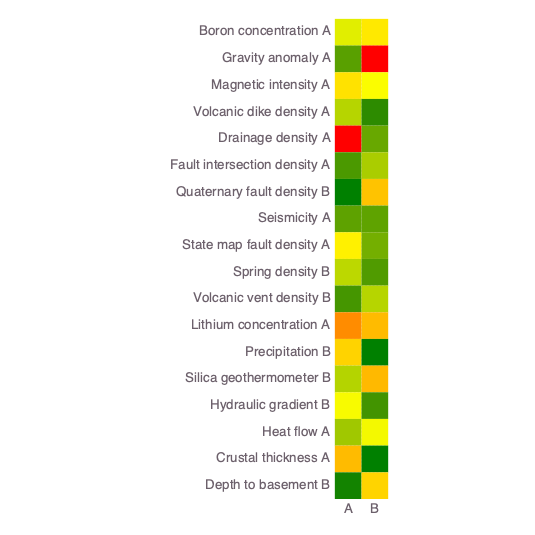

┌ Info: Attributes (signals=2)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S1) Count: 11
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S2) Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal A -> A Count: 11
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> B Count: 7
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360


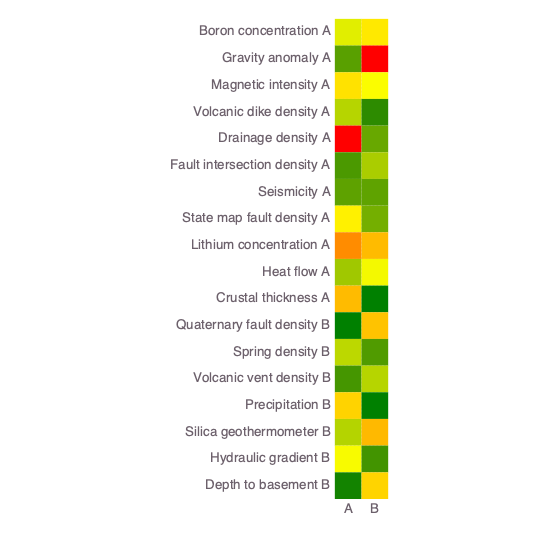

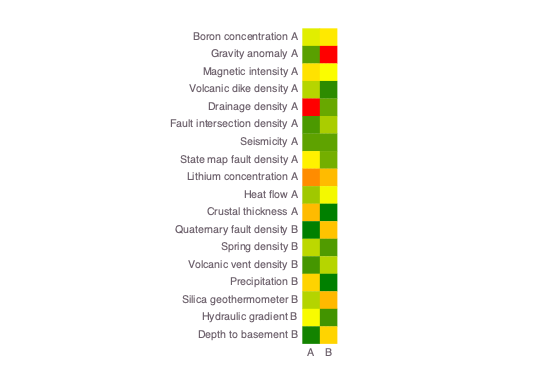

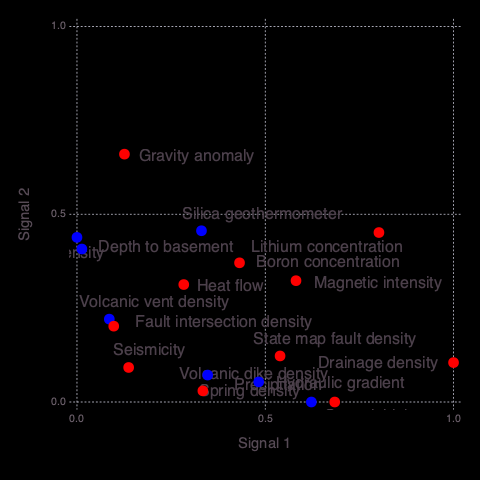

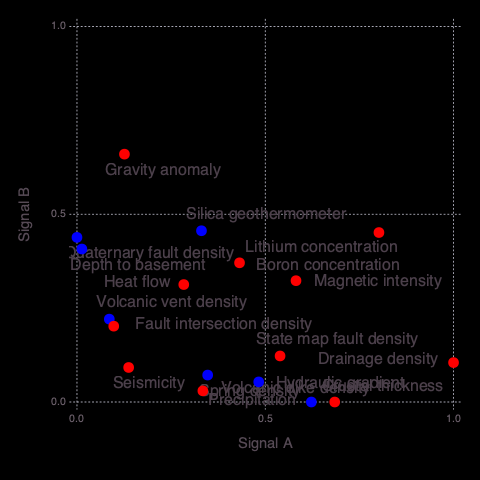

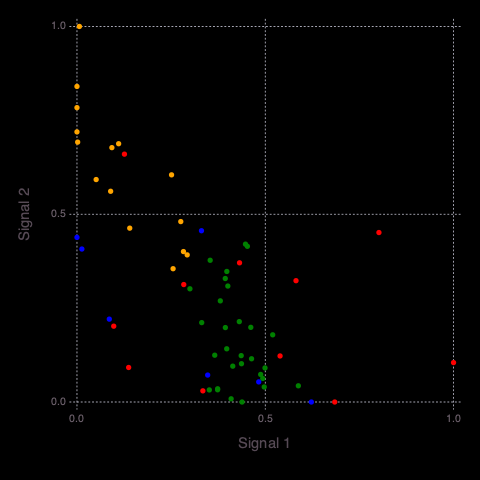

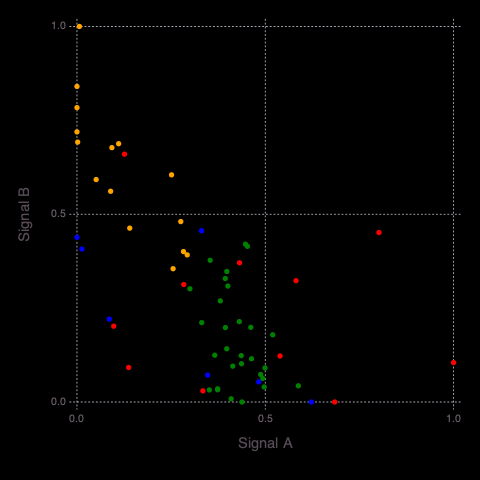

Signal importance (high->low): [1, 2, 3]
┌ Info: Number of signals: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=3)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697


23×2 Array{Any,2}:
 "Allen spr"       1.0
 "Turkey spr"      0.916375
 "Ash spr"         0.86
 "Gila spr 2"      0.81917
 "Garton well"     0.814428
 "Mimbres spr"     0.810983
 "Gila spr 1"      0.804735
 "Aragon spr"      0.760672
 "Spring Can"      0.74146
 "Riverside well"  0.729138
 "Freiborn spr"    0.726089
 "Well 1"          0.721013
 "Mangas spr"      0.710025
 "Spring"          0.702419
 "Cliff spr"       0.681147
 "Dent well"       0.67989
 "Ojo Caliente"    0.678069
 "Pueblo well"     0.624881
 "Rainbow spr"     0.623511
 "Jerry well"      0.59157
 "Apache well"     0.58789
 "Sacred spr"      0.586264
 "Kennecott well"  0.545995

13×2 Array{Any,2}:
 "Fed H1 well"     1.0
 "Well 4"          0.821925
 "Well 5"          0.773654
 "Los Alturas"     0.773565
 "Well 2"          0.752558
 "Lightning Dock"  0.71038
 "Radium spr"      0.671286
 "Carne well"      0.644475
 "Well 3"          0.610426
 "Victoria well"   0.492095
 "Faywood spr"     0.385637
 "Goat spr"        0.341865
 "Derry spr"       0.336225

8×2 Array{Any,2}:
 "Socorro Can"   1.0
 "Ojitos spr"    0.902801
 "Ojo Canas"     0.734799
 "T or C spr"    0.443392
 "B.Iorio well"  0.437021
 "Laguna Pbl"    0.288994
 "Warm spr"      0.177227
 "Alamos spr"    0.139853

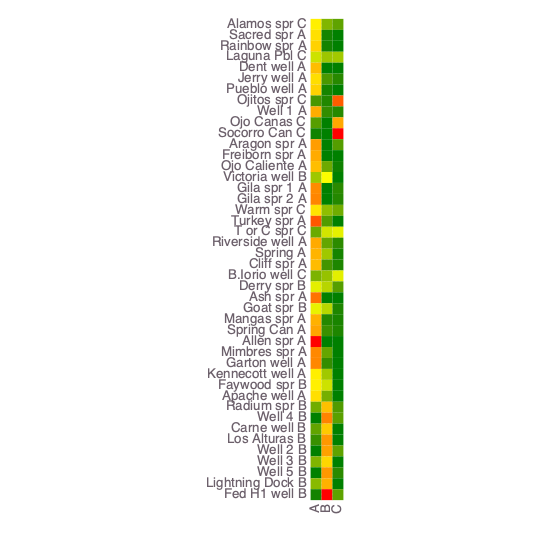

┌ Info: Robust k-means analysis results are loaded from file results-case01/Hmatrix-3-3_44-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-case01/Wmatrix-3-3_18-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solutio

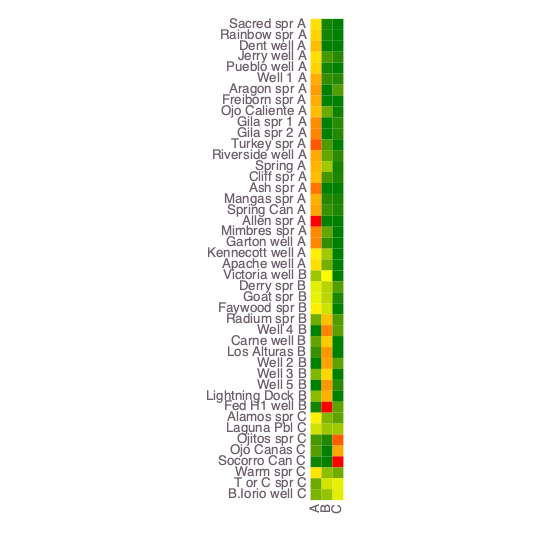

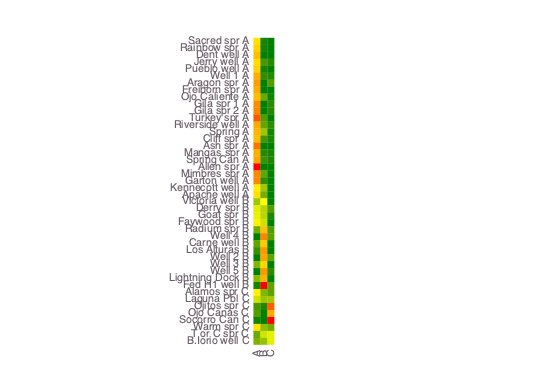

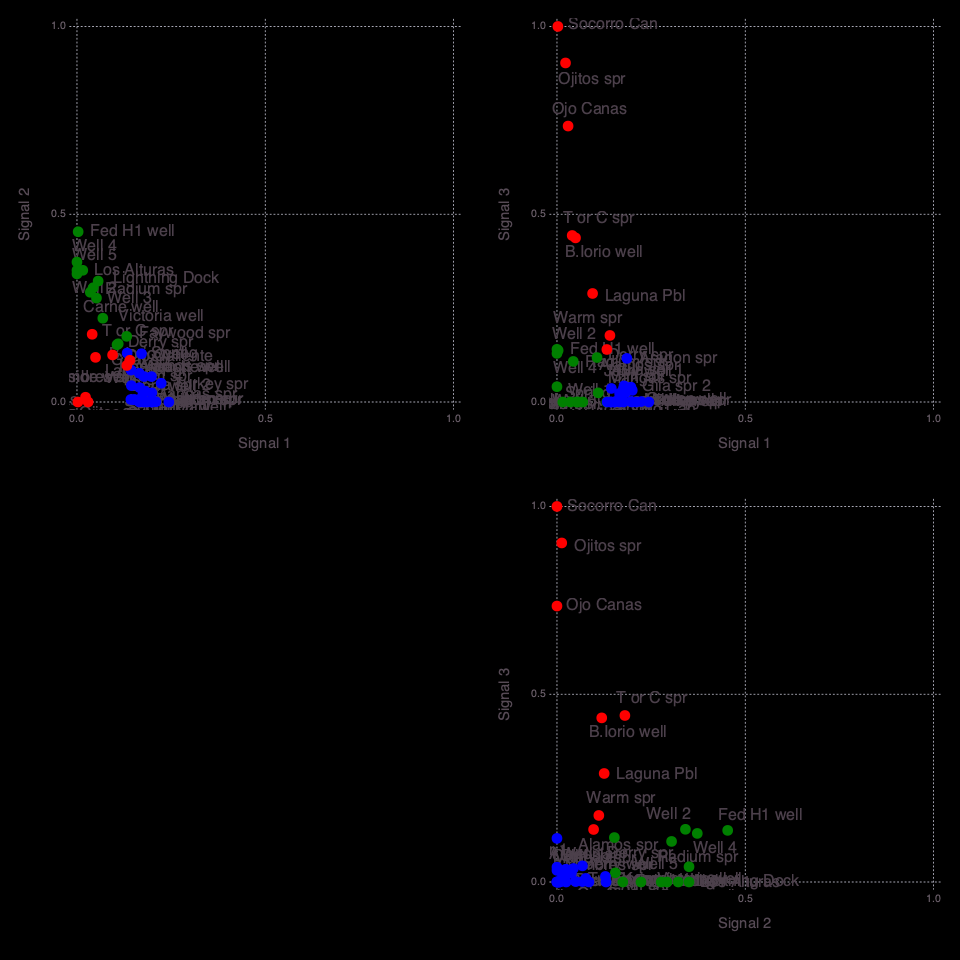

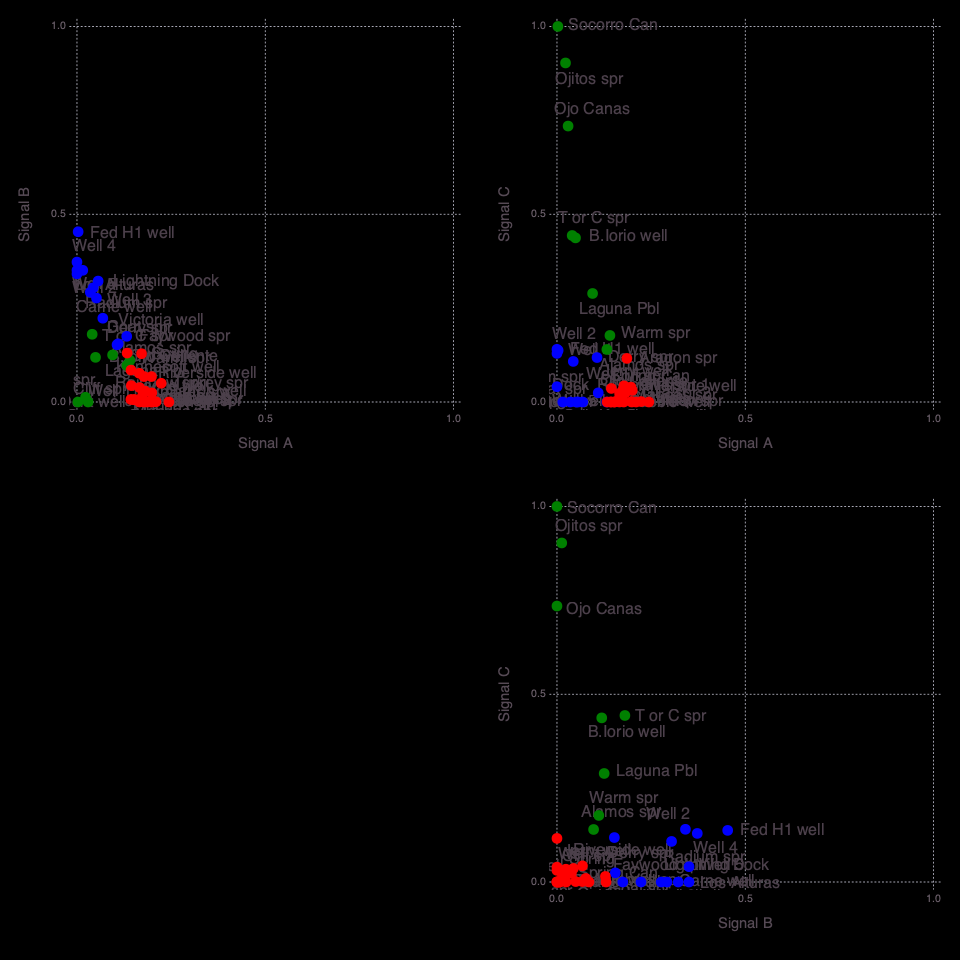

3×2 Array{Any,2}:
 "State map fault density"  0.496198
 "Hydraulic gradient"       0.469537
 "Silica geothermometer"    0.439841

6×2 Array{Any,2}:
 "Depth to basement"         0.676939
 "Boron concentration"       0.511079
 "Quaternary fault density"  0.460437
 "Volcanic vent density"     0.27834
 "Spring density"            0.0
 "Precipitation"             0.0

9×2 Array{Any,2}:
 "Fault intersection density"  1.0
 "Seismicity"                  0.967935
 "Drainage density"            0.952827
 "Lithium concentration"       0.858236
 "Magnetic intensity"          0.403114
 "Crustal thickness"           0.346896
 "Gravity anomaly"             0.297228
 "Heat flow"                   0.290886
 "Volcanic dike density"       0.28542

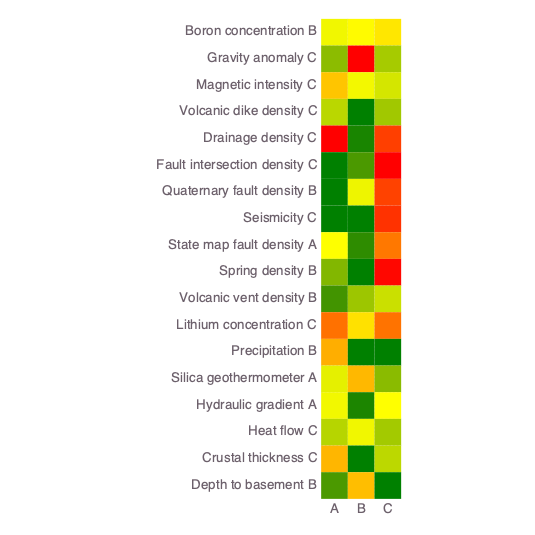

┌ Info: Attributes (signals=3)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S3) Count: 9
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S2) Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S1) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C -> A Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> B Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> C Count: 9
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal C (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360


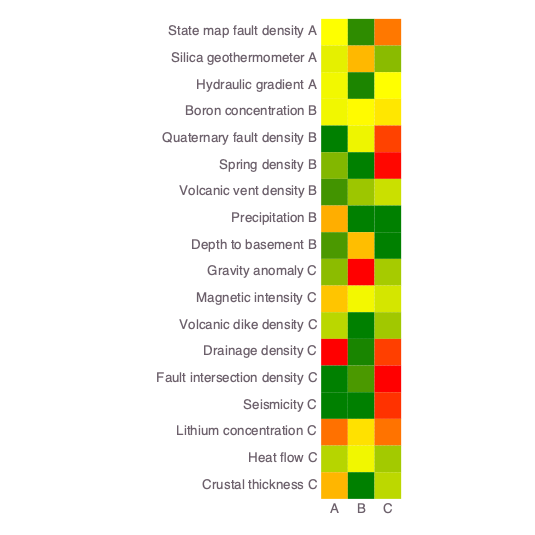

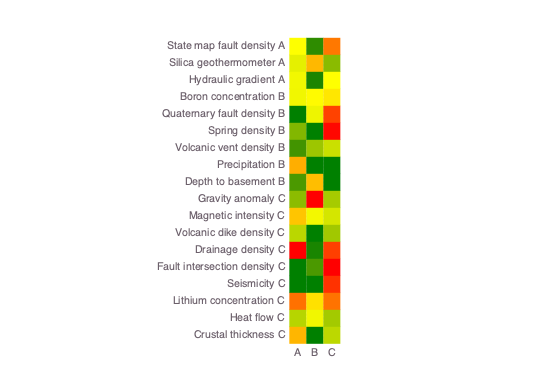

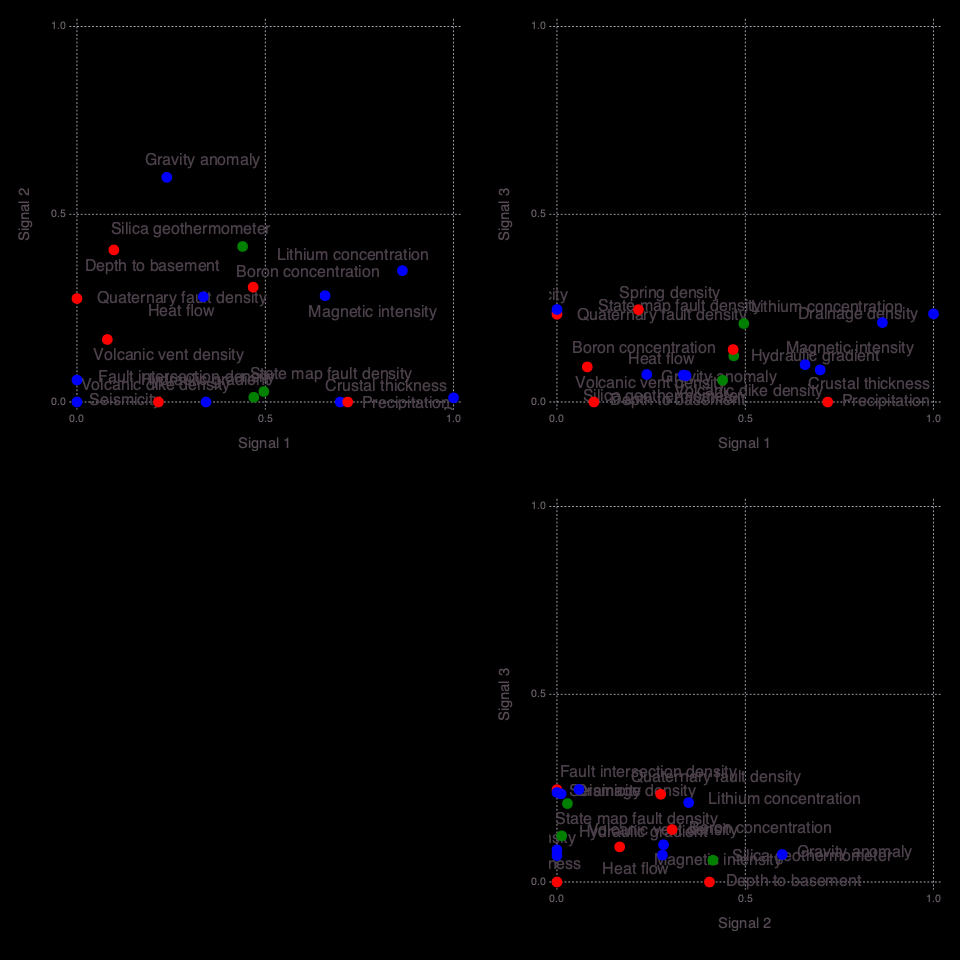

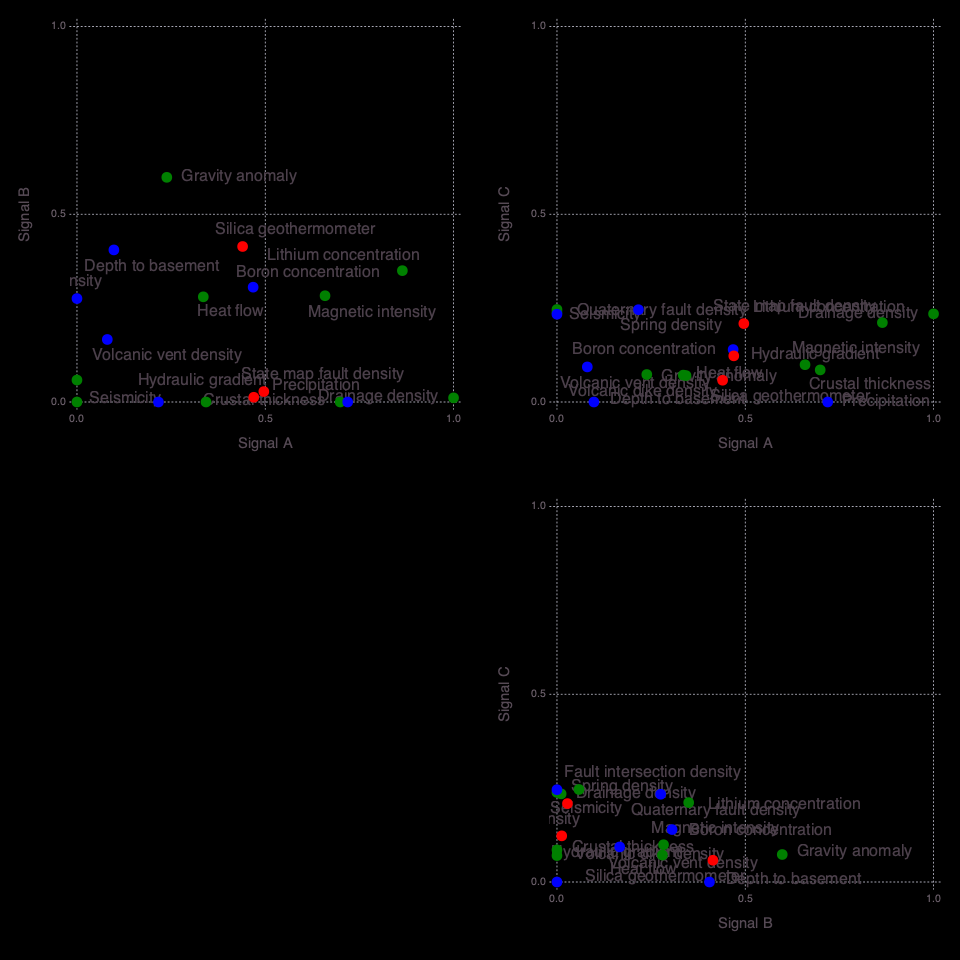

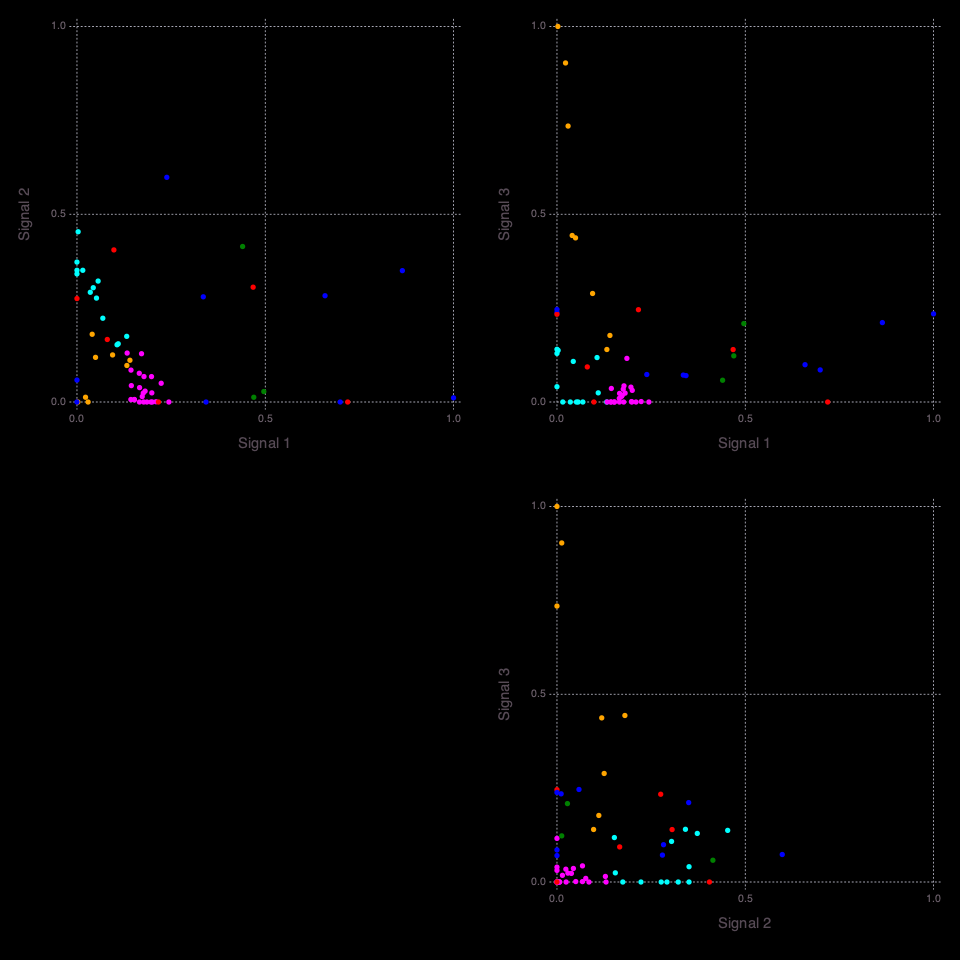

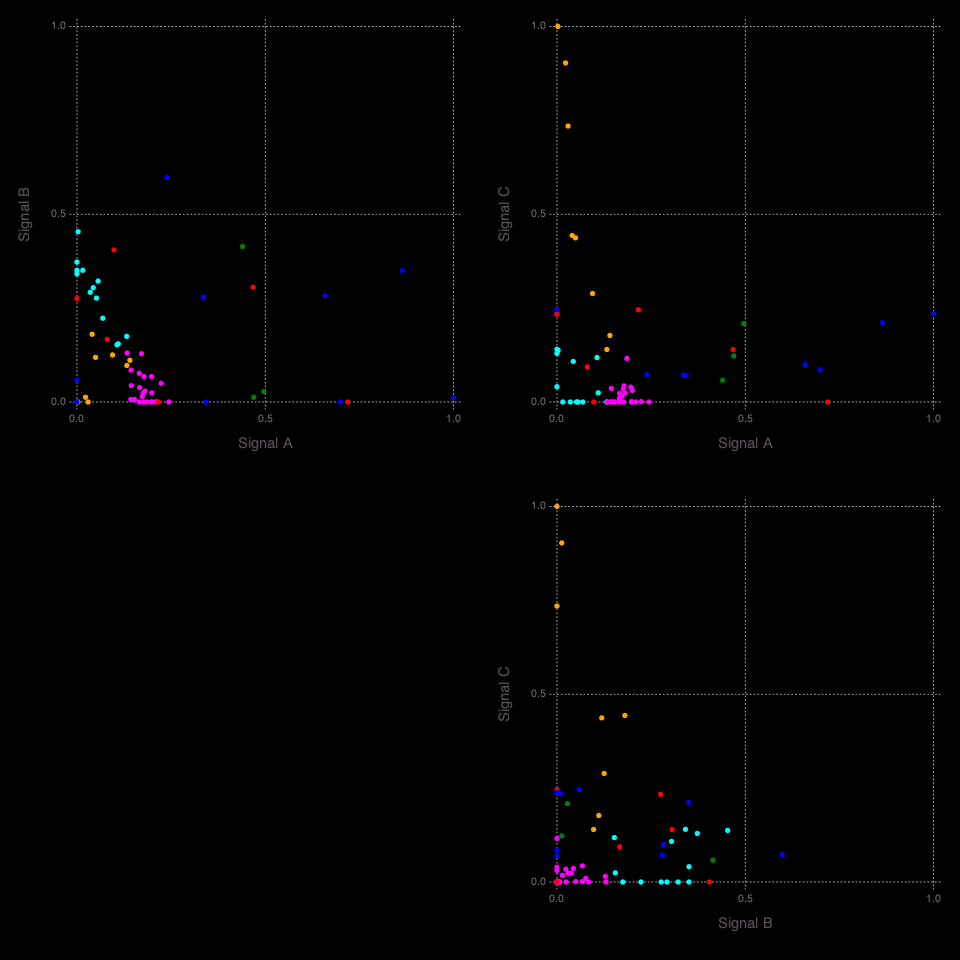

Signal importance (high->low): [2, 1, 4, 3]
┌ Info: Number of signals: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=4)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697


15×2 Array{Any,2}:
 "Allen spr"       1.0
 "Turkey spr"      0.890671
 "Ash spr"         0.860399
 "Garton well"     0.837981
 "Mimbres spr"     0.756788
 "Spring"          0.727799
 "Mangas spr"      0.697281
 "Gila spr 1"      0.667903
 "Spring Can"      0.647347
 "Gila spr 2"      0.646943
 "Riverside well"  0.602983
 "Cliff spr"       0.592572
 "Freiborn spr"    0.579998
 "Apache well"     0.569518
 "Kennecott well"  0.546961

13×2 Array{Any,2}:
 "Fed H1 well"     1.0
 "Well 4"          0.820447
 "Los Alturas"     0.774358
 "Well 5"          0.771269
 "Well 2"          0.755708
 "Lightning Dock"  0.70557
 "Radium spr"      0.666575
 "Carne well"      0.631706
 "Well 3"          0.596359
 "Victoria well"   0.477645
 "Faywood spr"     0.378783
 "Goat spr"        0.330589
 "Derry spr"       0.324788

10×2 Array{Any,2}:
 "Jerry well"    1.0
 "Pueblo well"   0.978656
 "Rainbow spr"   0.926226
 "Sacred spr"    0.920803
 "Dent well"     0.911277
 "Alamos spr"    0.869018
 "Laguna Pbl"    0.779479
 "Well 1"        0.701792
 "Aragon spr"    0.678922
 "Ojo Caliente"  0.473437

┌ Info: Robust k-means analysis results are loaded from file results-case01/Hmatrix-4-4_44-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-case01/Wmatrix-4-4_18-100

6×2 Array{Any,2}:
 "Socorro Can"   1.0
 "Ojitos spr"    0.897681
 "Ojo Canas"     0.725719
 "T or C spr"    0.449617
 "B.Iorio well"  0.445734
 "Warm spr"      0.177576

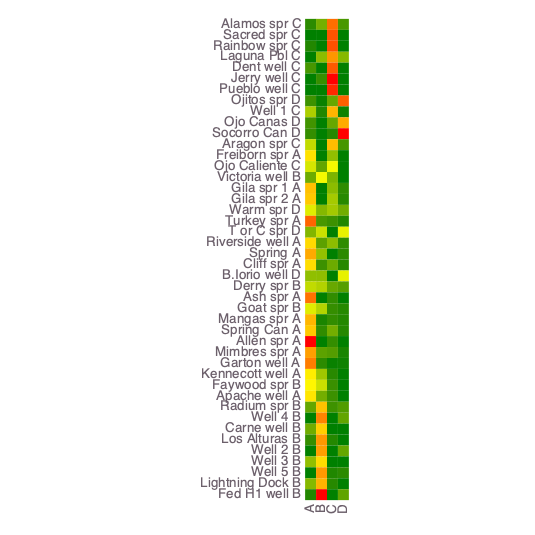

┌ Info: Signal D (S3) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


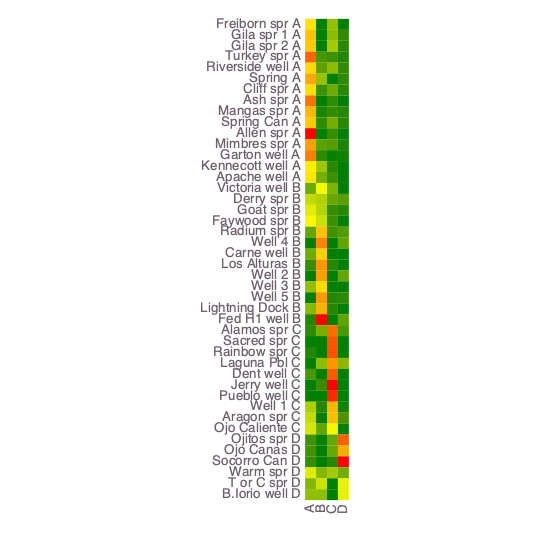

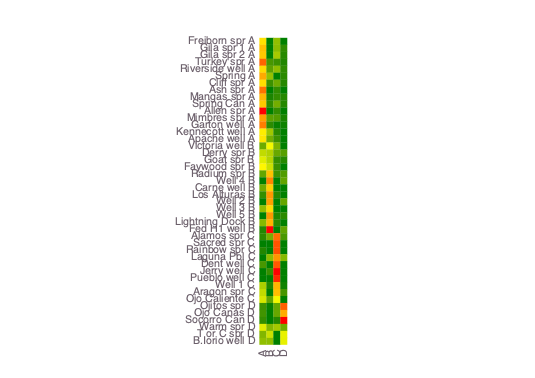

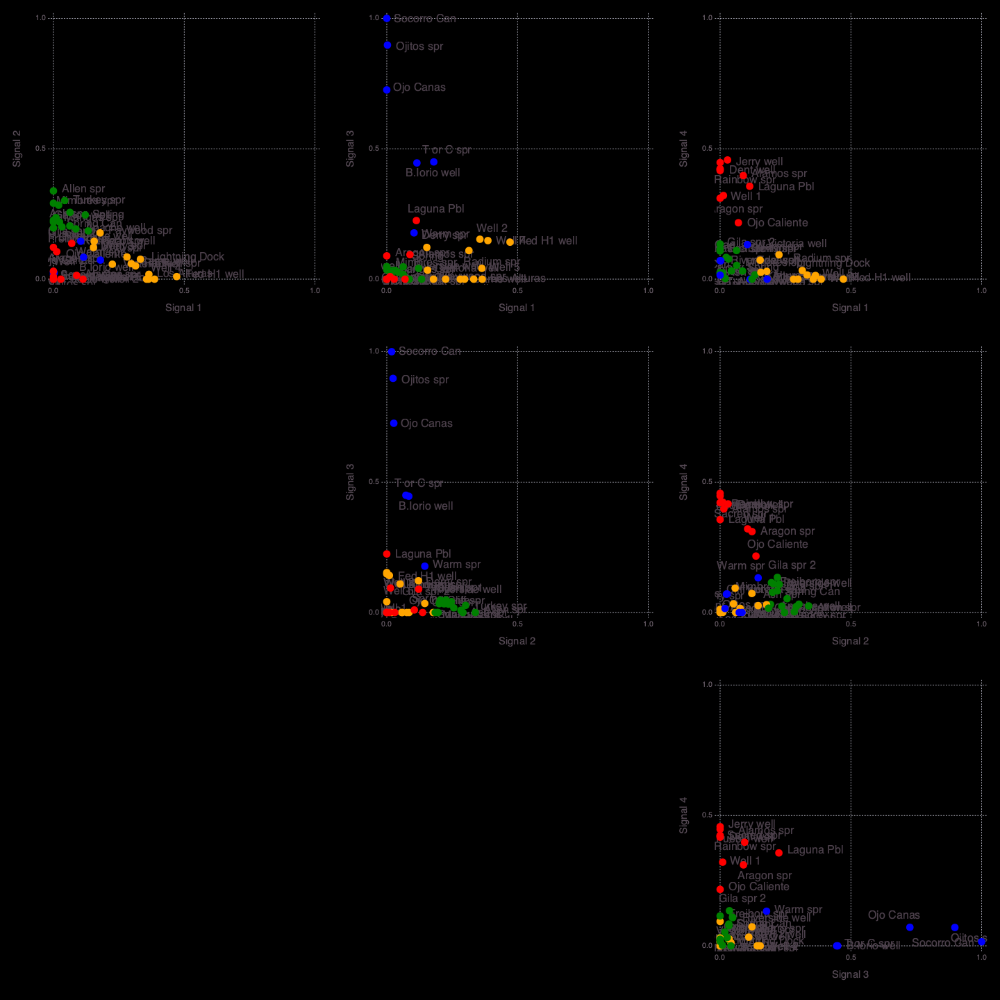

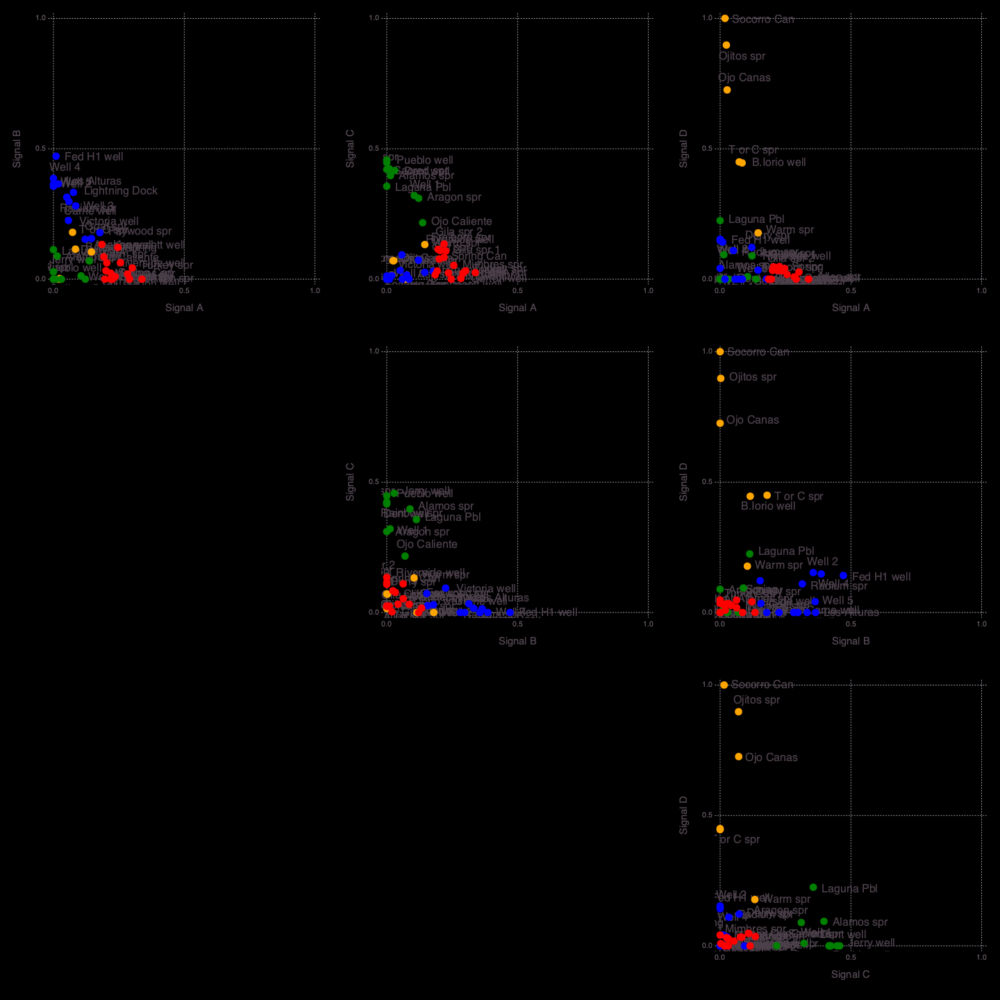

3×2 Array{Any,2}:
 "Silica geothermometer"    0.565319
 "State map fault density"  0.516354
 "Volcanic dike density"    0.46948

4×2 Array{Any,2}:
 "Depth to basement"         0.698015
 "Quaternary fault density"  0.473285
 "Hydraulic gradient"        0.00393436
 "Precipitation"             0.0

5×2 Array{Any,2}:
 "Crustal thickness"           1.0
 "Magnetic intensity"          0.556994
 "Drainage density"            0.495465
 "Heat flow"                   0.311164
 "Fault intersection density"  0.0

6×2 Array{Any,2}:
 "Seismicity"             0.95485
 "Spring density"         0.924999
 "Lithium concentration"  0.779688
 "Boron concentration"    0.465497
 "Volcanic vent density"  0.359763
 "Gravity anomaly"        0.313199

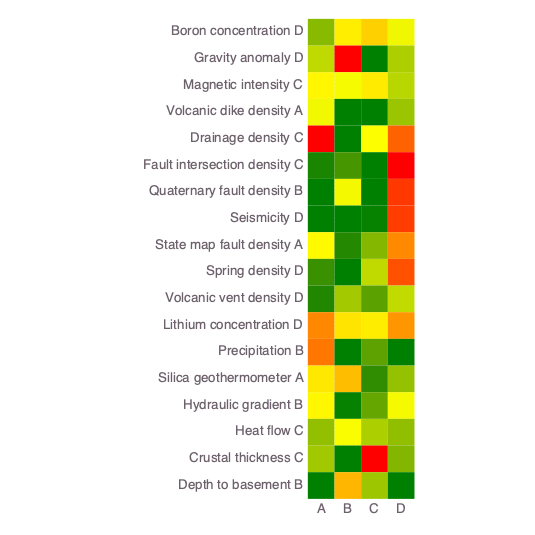

┌ Info: Attributes (signals=4)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S3) Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S4) Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S1) Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D (S2) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D -> A Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal C -> B Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> C Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> D Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:360
┌ Info: Signal B (remapped k-means clusterin

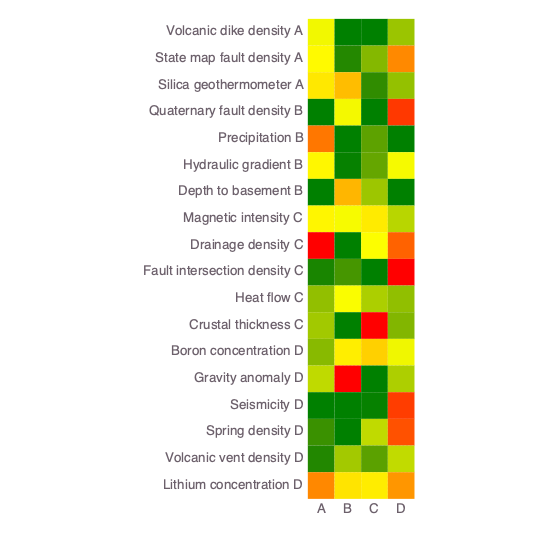

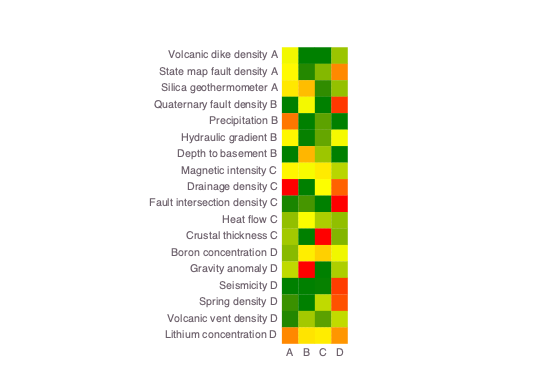

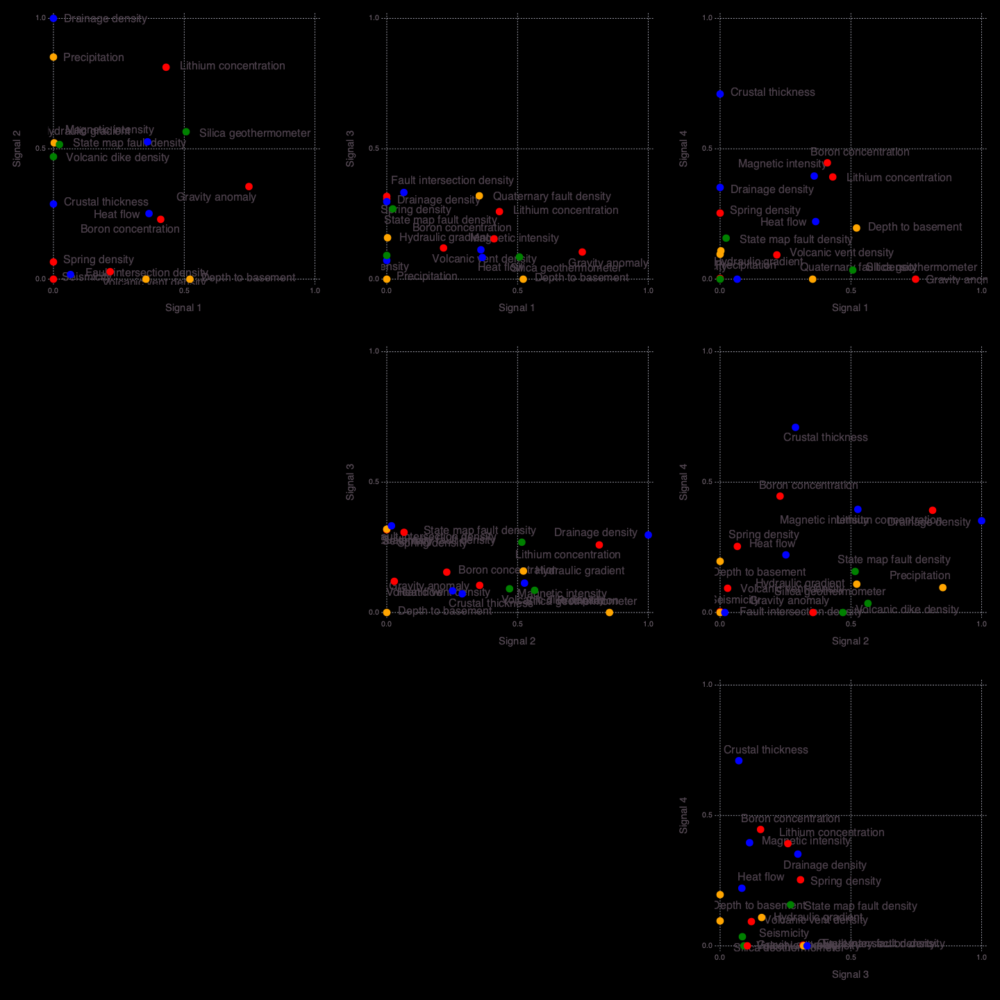

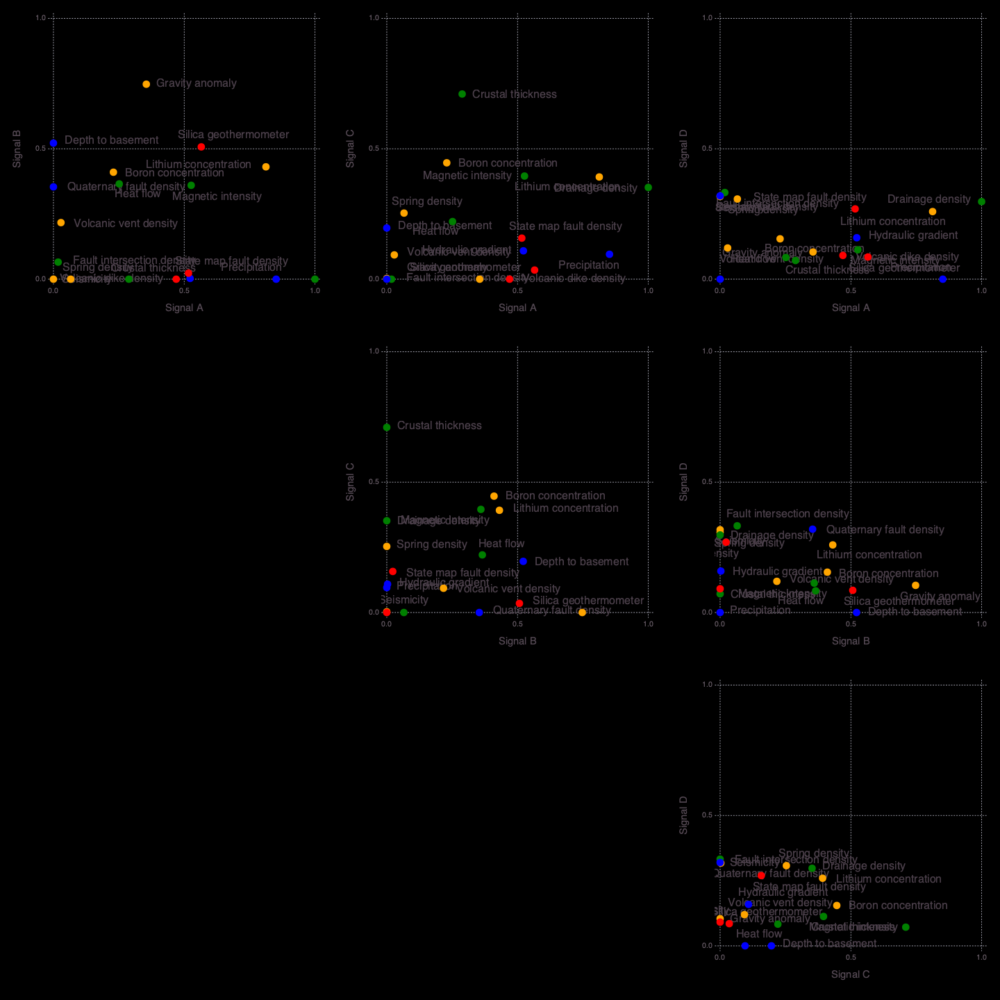

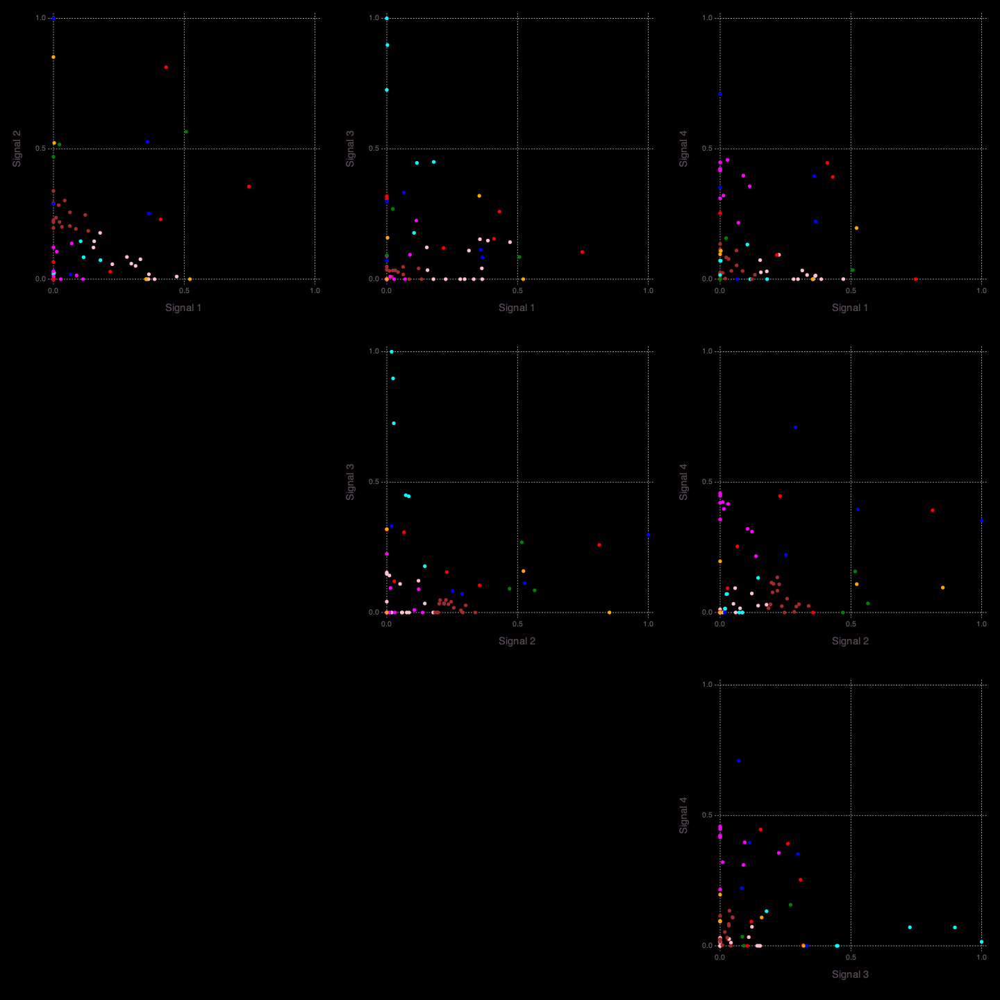

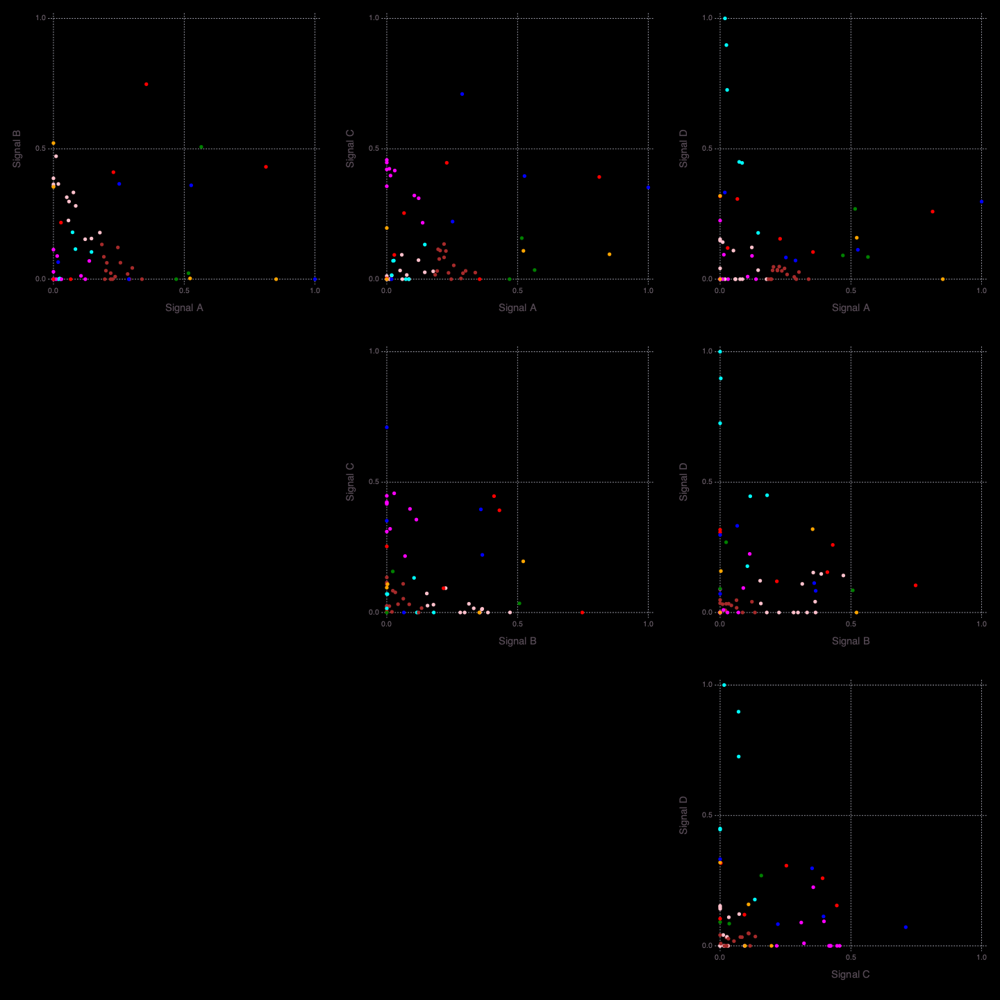

Signal importance (high->low): [1, 4, 2, 3, 5]
┌ Info: Number of signals: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=5)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-case01/Hmatrix-5-5_44-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158

16×2 Array{Any,2}:
 "Ash spr"         1.0
 "Allen spr"       0.932476
 "Mangas spr"      0.883364
 "Riverside well"  0.834285
 "Apache well"     0.782126
 "Spring Can"      0.691235
 "Turkey spr"      0.677725
 "Spring"          0.676908
 "Cliff spr"       0.650192
 "Warm spr"        0.649358
 "Garton well"     0.617193
 "Faywood spr"     0.60702
 "Kennecott well"  0.598779
 "Derry spr"       0.578414
 "Mimbres spr"     0.564978
 "Goat spr"        0.36953

10×2 Array{Any,2}:
 "Fed H1 well"     1.0
 "Well 4"          0.848078
 "Los Alturas"     0.815345
 "Well 2"          0.788889
 "Well 5"          0.777949
 "Lightning Dock"  0.687945
 "Carne well"      0.627357
 "Radium spr"      0.625606
 "Well 3"          0.59283
 "Victoria well"   0.379997

8×2 Array{Any,2}:
 "Jerry well"   1.0
 "Pueblo well"  0.971051
 "Rainbow spr"  0.942867
 "Sacred spr"   0.935706
 "Dent well"    0.927135
 "Alamos spr"   0.872535
 "Laguna Pbl"   0.85495
 "Well 1"       0.738413

5×2 Array{Any,2}:
 "Socorro Can"   1.0
 "Ojitos spr"    0.885484
 "Ojo Canas"     0.707981
 "T or C spr"    0.411346
 "B.Iorio well"  0.409252

5×2 Array{Any,2}:
 "Freiborn spr"  1.0
 "Gila spr 1"    0.779561
 "Gila spr 2"    0.695982
 "Aragon spr"    0.695158
 "Ojo Caliente"  0.359767

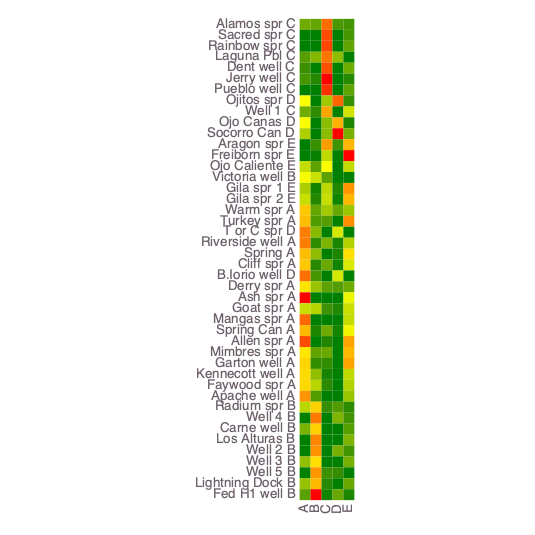

┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Info: Signal A -> A Count: 16
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal B -> B Count: 10
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal C -> C Count: 8
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal D -> D Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal E -> E Count: 5
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:255
┌ Info: Signal A (S1) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal B (S4) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal C (S3) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal D (S5) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev

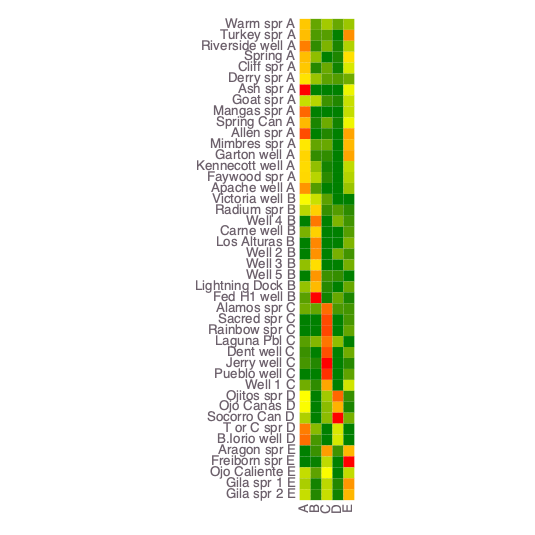

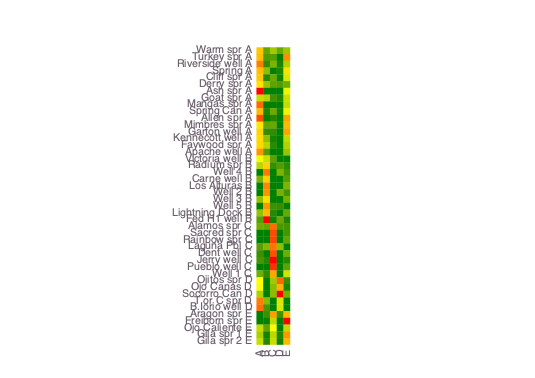

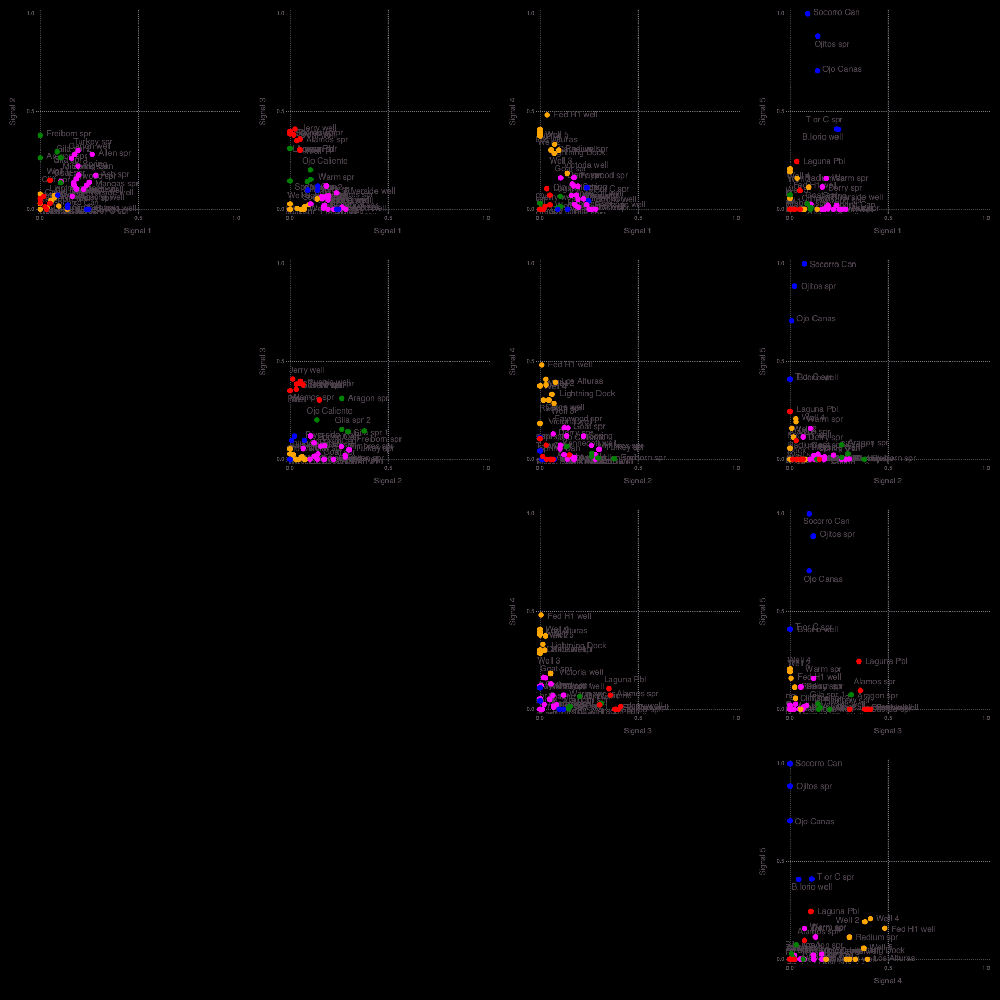

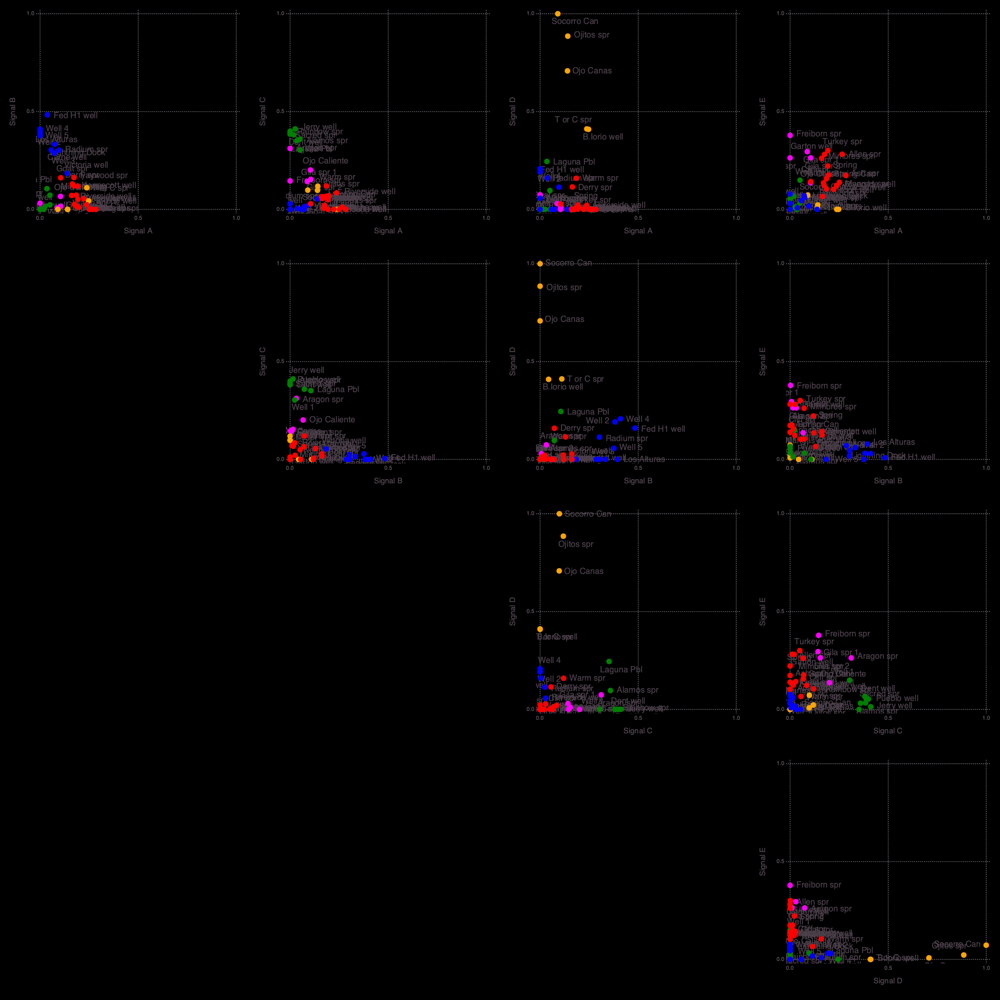

2×2 Array{Any,2}:
 "Lithium concentration"  1.0
 "Volcanic dike density"  0.56854

6×2 Array{Any,2}:
 "Depth to basement"         0.760709
 "Boron concentration"       0.565134
 "Quaternary fault density"  0.481084
 "Volcanic vent density"     0.303895
 "Spring density"            0.0
 "Precipitation"             0.0

4×2 Array{Any,2}:
 "Crustal thickness"   1.0
 "Magnetic intensity"  0.590051
 "Seismicity"          0.0030882
 "Gravity anomaly"     0.0

3×2 Array{Any,2}:
 "Fault intersection density"  0.921753
 "Drainage density"            0.458627
 "Heat flow"                   0.183895

3×2 Array{Any,2}:
 "State map fault density"  0.755023
 "Hydraulic gradient"       0.743237
 "Silica geothermometer"    0.553526

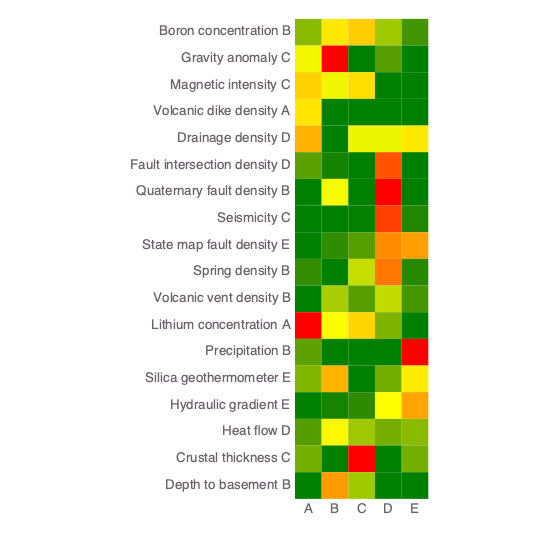

┌ Info: Attributes (signals=5)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S4) Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S3) Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S5) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D (S2) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E (S1) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E -> A Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal A -> B Count: 6
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal B -> C Count: 4
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal C -> D Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal D -> E Count: 3
└ @ NMFk /Users/vvv/.julia/de

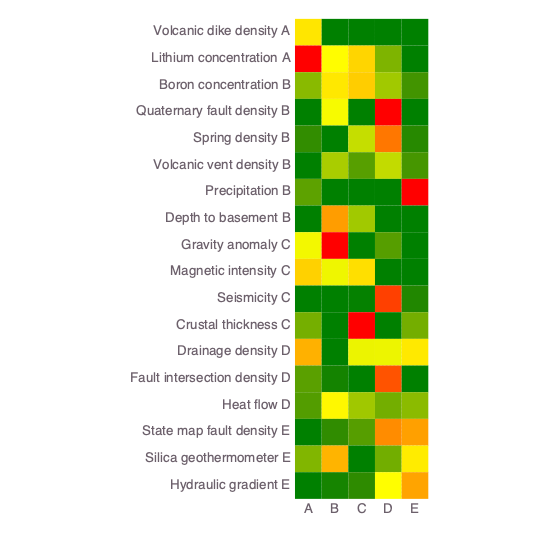

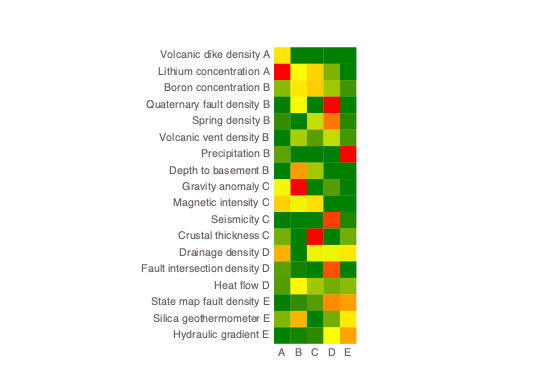

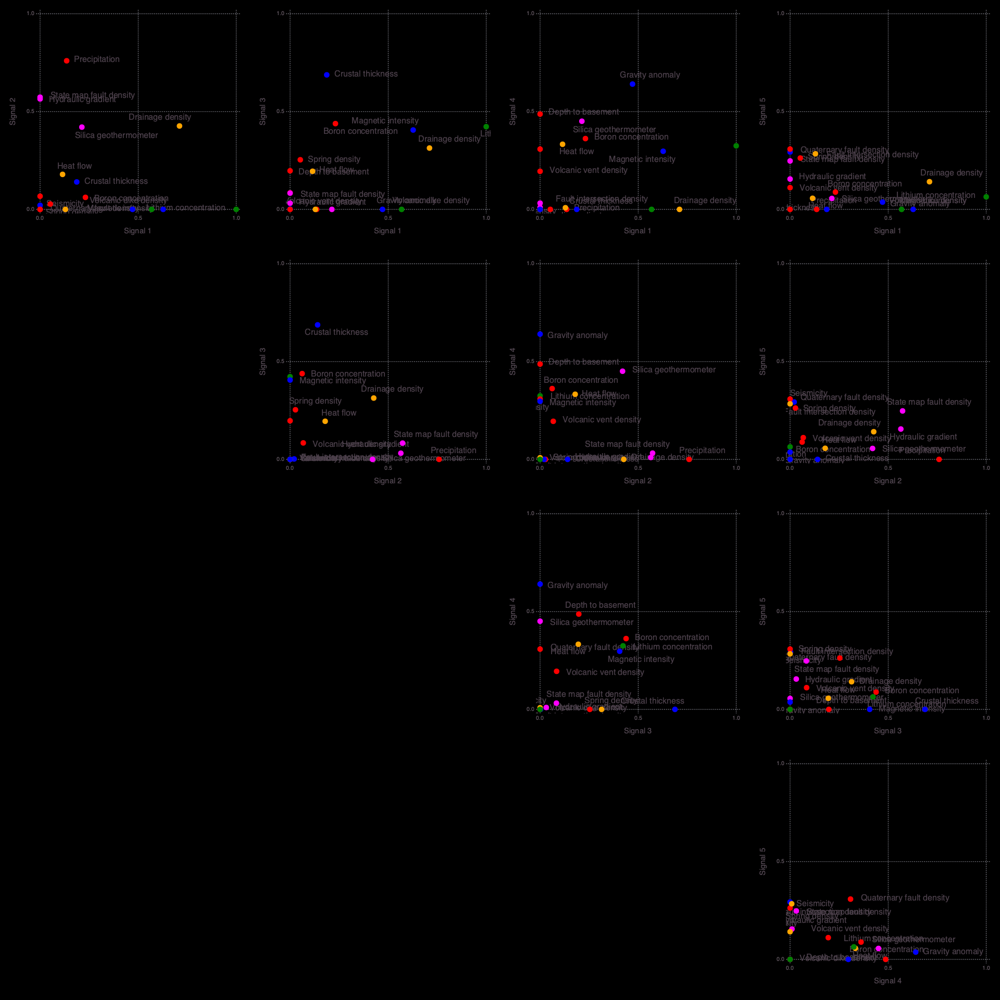

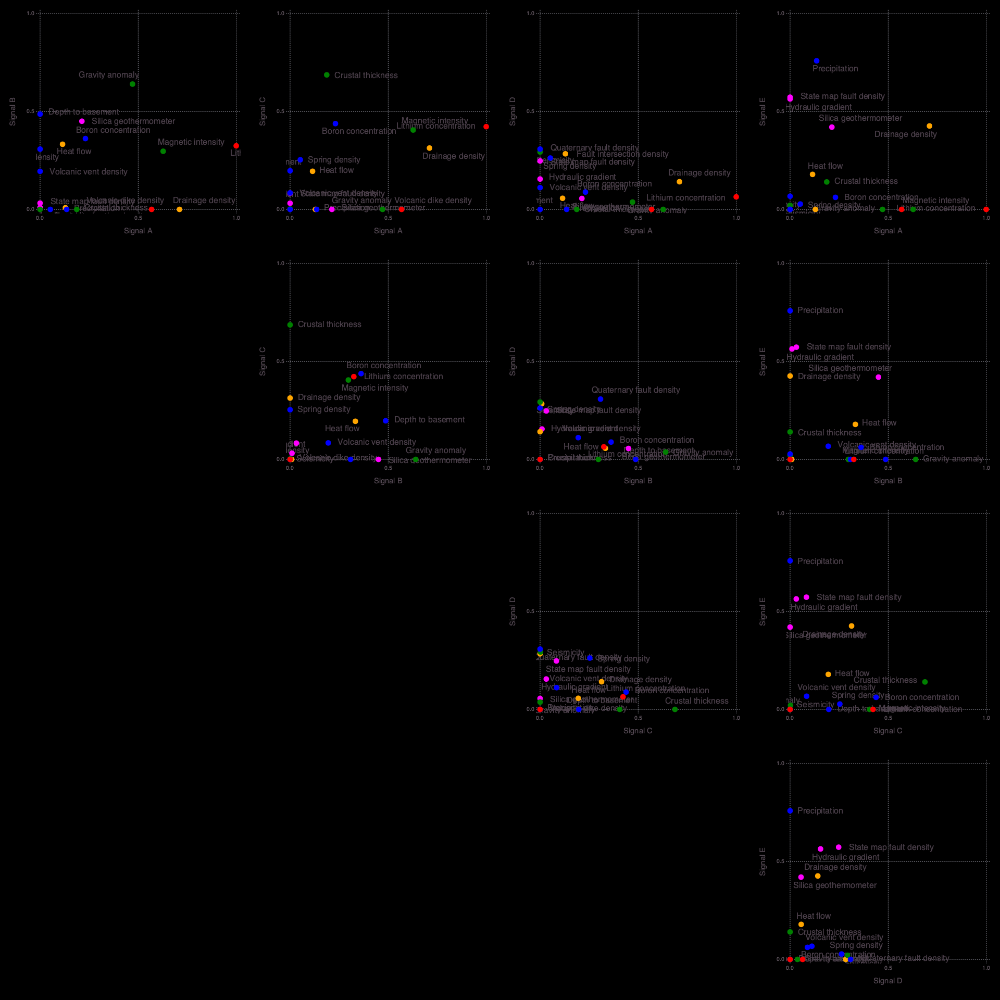

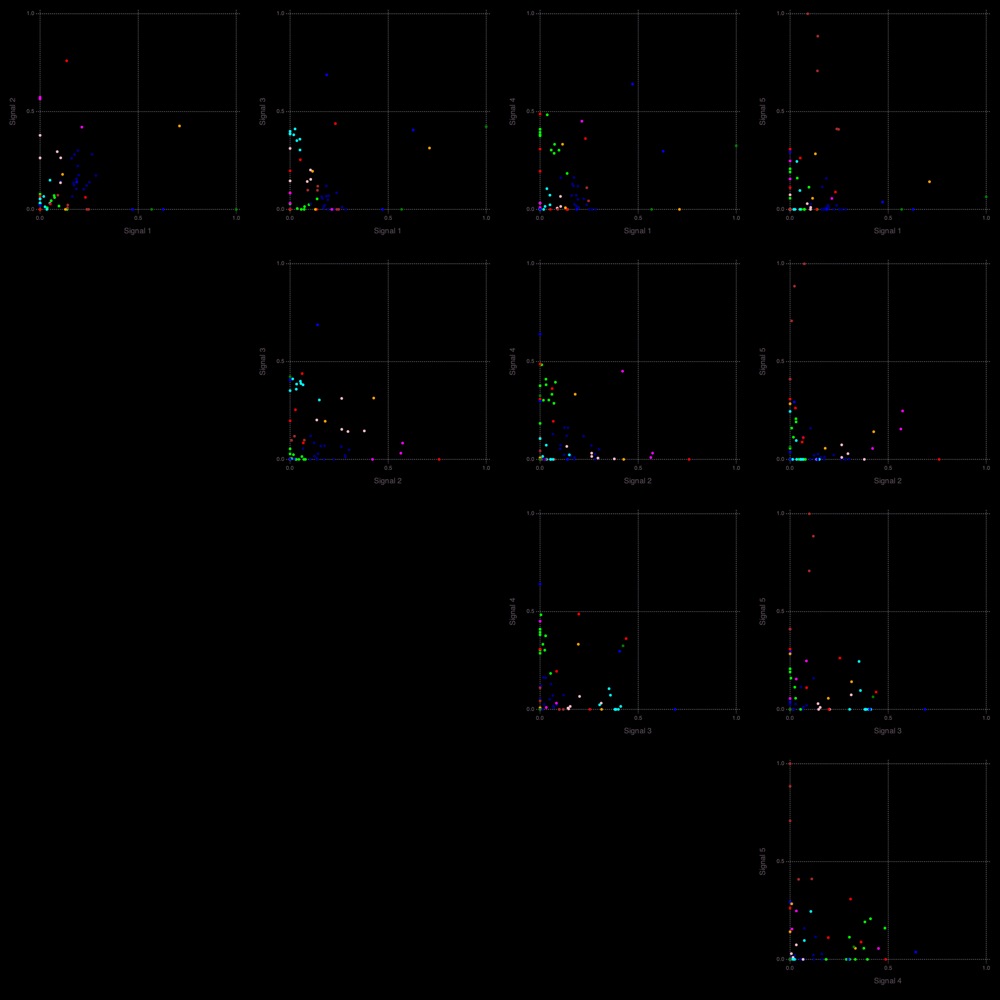

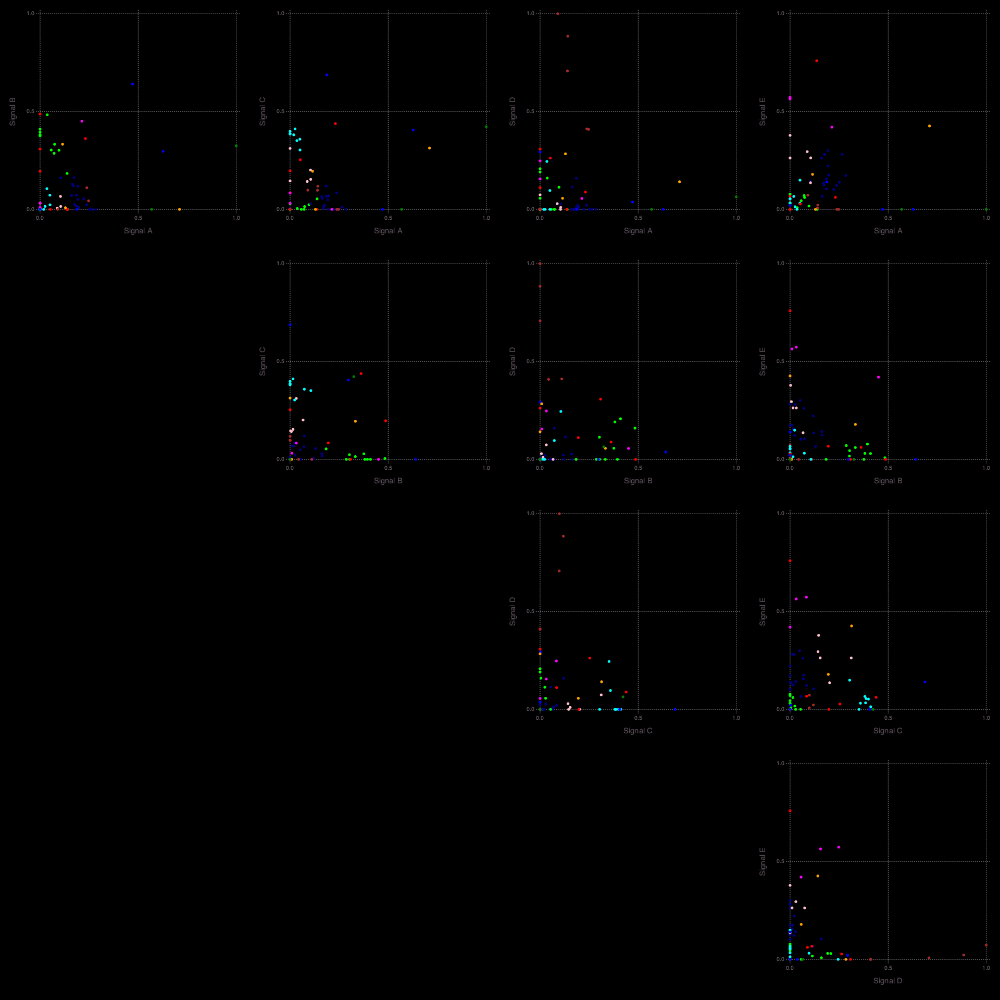

Signal importance (high->low): [2, 4, 8, 5, 1, 3, 7, 6]
┌ Info: Number of signals: 8
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:144
┌ Info: Locations (signals=8)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:148
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697


10×2 Array{Any,2}:
 "Ash spr"         1.0
 "Apache well"     0.950743
 "Spring Can"      0.798039
 "Mangas spr"      0.70694
 "Derry spr"       0.663338
 "Spring"          0.587286
 "Kennecott well"  0.550769
 "Faywood spr"     0.453699
 "Warm spr"        0.414987
 "Goat spr"        0.31845

7×2 Array{Any,2}:
 "Pueblo well"  1.0
 "Jerry well"   0.982349
 "Dent well"    0.884569
 "Rainbow spr"  0.884056
 "Sacred spr"   0.877946
 "Alamos spr"   0.733233
 "Laguna Pbl"   0.692272

7×2 Array{Any,2}:
 "Gila spr 2"      1.0
 "Aragon spr"      0.997091
 "Gila spr 1"      0.945916
 "Ojo Caliente"    0.578686
 "Well 1"          0.550929
 "Riverside well"  0.549312
 "Cliff spr"       0.5445

6×2 Array{Any,2}:
 "Victoria well"   0.949464
 "Lightning Dock"  0.823669
 "Radium spr"      0.601781
 "Carne well"      0.596224
 "Well 3"          0.531882
 "Los Alturas"     0.0

5×2 Array{Any,2}:
 "Allen spr"     1.0
 "Freiborn spr"  0.780095
 "Mimbres spr"   0.514682
 "Turkey spr"    0.427395
 "Garton well"   0.358771

4×2 Array{Any,2}:
 "Fed H1 well"  0.915735
 "Well 4"       0.772875
 "Well 2"       0.732798
 "Well 5"       0.720996

┌ Info: Robust k-means analysis results are loaded from file results-case01/Hmatrix-8-8_44-1000.jld!
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:67
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkCluster.jl:158
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float64,2},Core.Float64,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/vvv/.julia/packages/JLD/nQ9iW/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file results-case01/Wmatrix-8-8_18-100

3×2 Array{Any,2}:
 "Socorro Can"  1.0
 "Ojitos spr"   0.948793
 "Ojo Canas"    0.834717

2×2 Array{Any,2}:
 "B.Iorio well"  0.929309
 "T or C spr"    0.905042

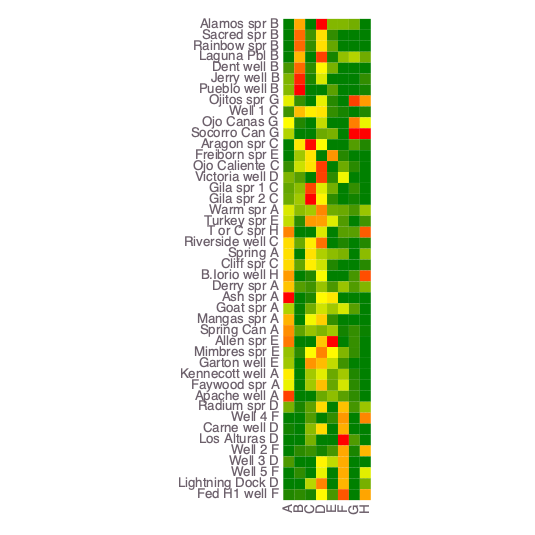

┌ Info: Signal G (S6) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272
┌ Info: Signal H (S1) (k-means clustering)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:272


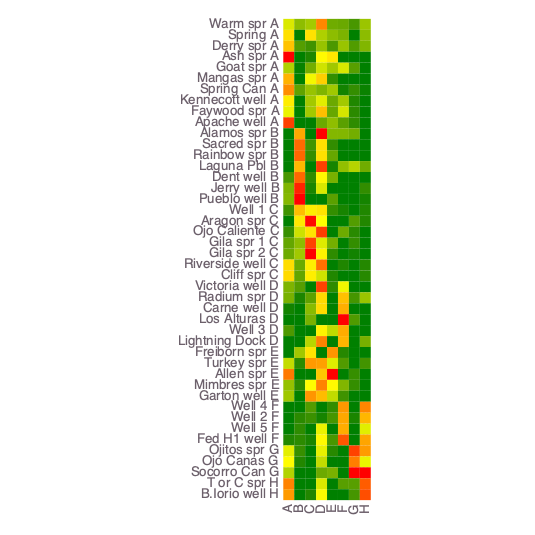

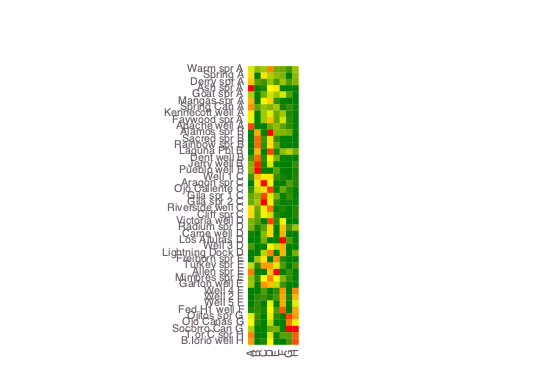

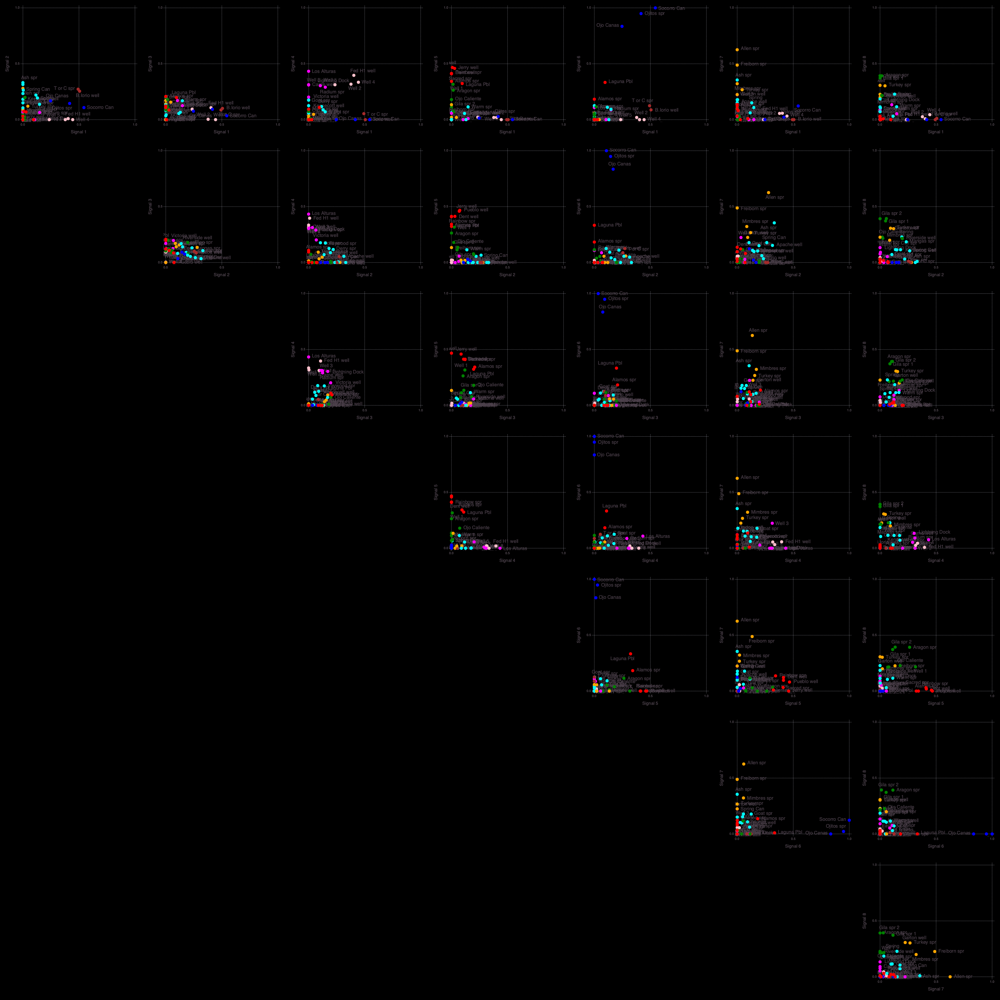

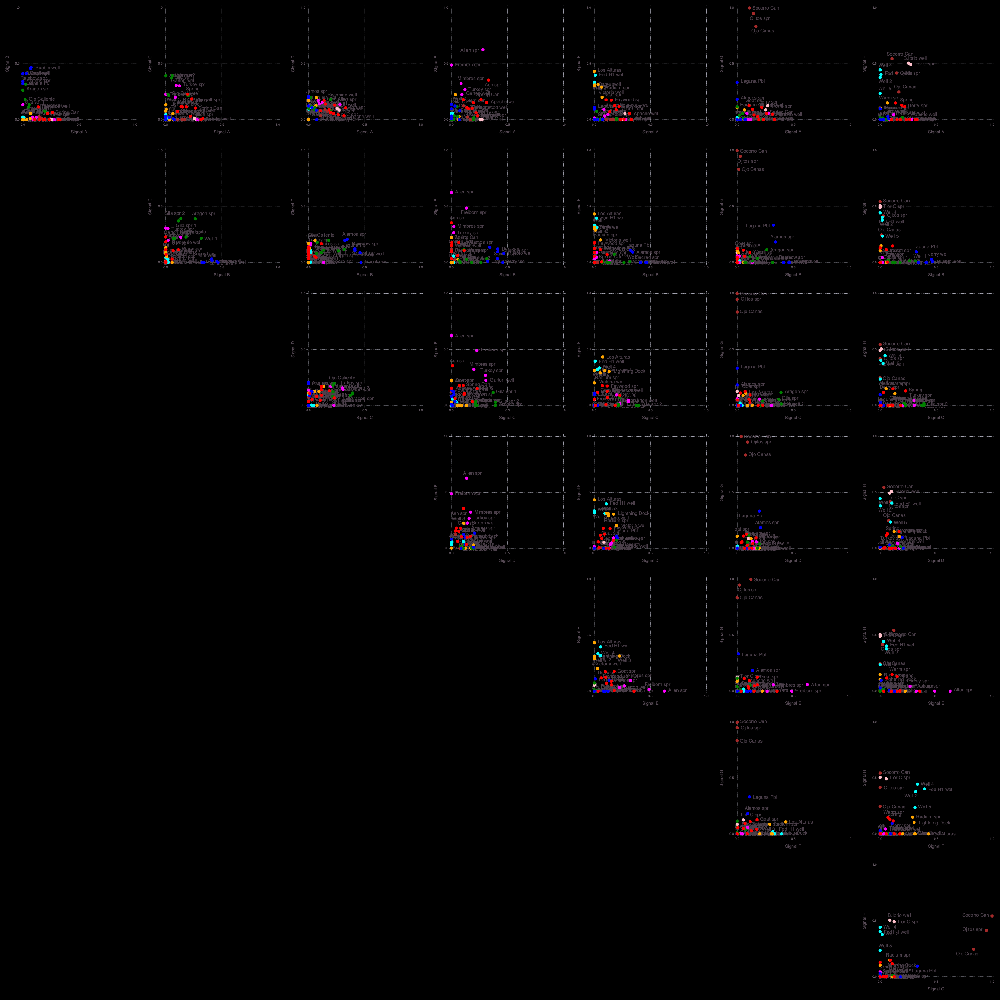

2×2 Array{Any,2}:
 "Drainage density"            1.0
 "Fault intersection density"  0.139857

2×2 Array{Any,2}:
 "Crustal thickness"   1.0
 "Magnetic intensity"  0.593375

2×2 Array{Any,2}:
 "State map fault density"  0.889845
 "Volcanic dike density"    0.0

3×2 Array{Any,2}:
 "Lithium concentration"  1.0
 "Boron concentration"    0.0468254
 "Seismicity"             0.0

3×2 Array{Any,2}:
 "Hydraulic gradient"     1.0
 "Silica geothermometer"  0.0
 "Depth to basement"      0.0

1×2 Array{Any,2}:
 "Gravity anomaly"  1.0

2×2 Array{Any,2}:
 "Spring density"  0.957
 "Heat flow"       0.308393

3×2 Array{Any,2}:
 "Quaternary fault density"  1.0
 "Volcanic vent density"     0.442817
 "Precipitation"             0.0

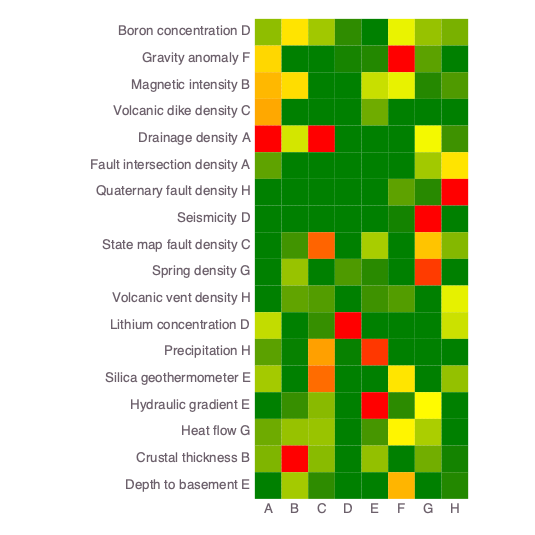

┌ Info: Attributes (signals=8)
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:322
┌ Info: Signal A (S3) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal B (S1) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal C (S7) Count: 3
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal D (S5) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal E (S8) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal F (S2) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal G (S6) Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal H (S4) Count: 1
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:335
┌ Info: Signal F -> A Count: 2
└ @ NMFk /Users/vvv/.julia/dev/NMFk/src/NMFkPostprocess.jl:345
┌ Info: Signal D -> B Count: 2
└ @ NMFk /Users/vvv/.julia/de

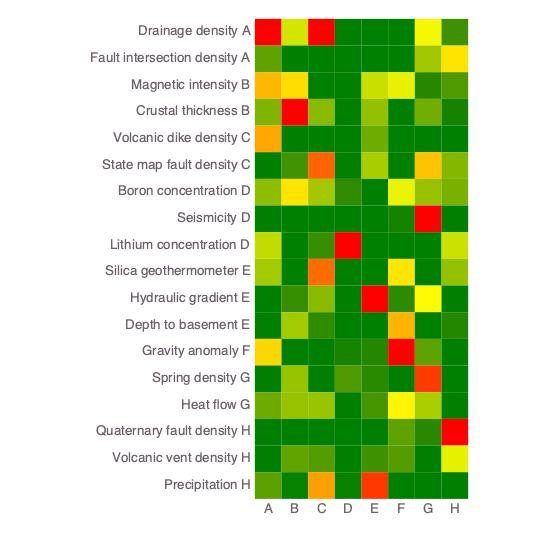

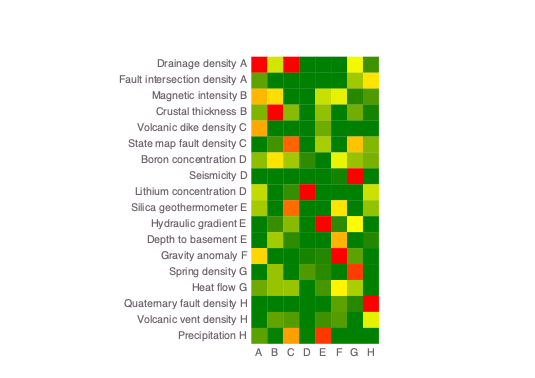

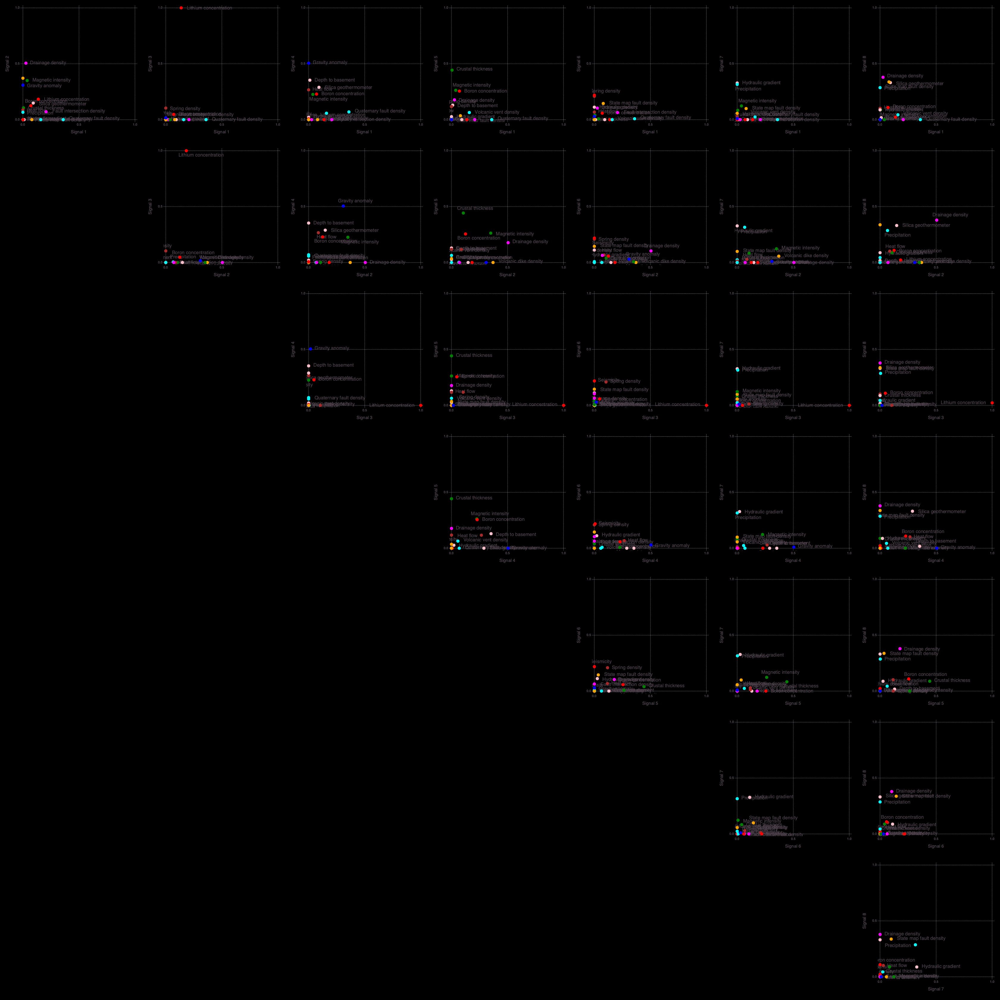

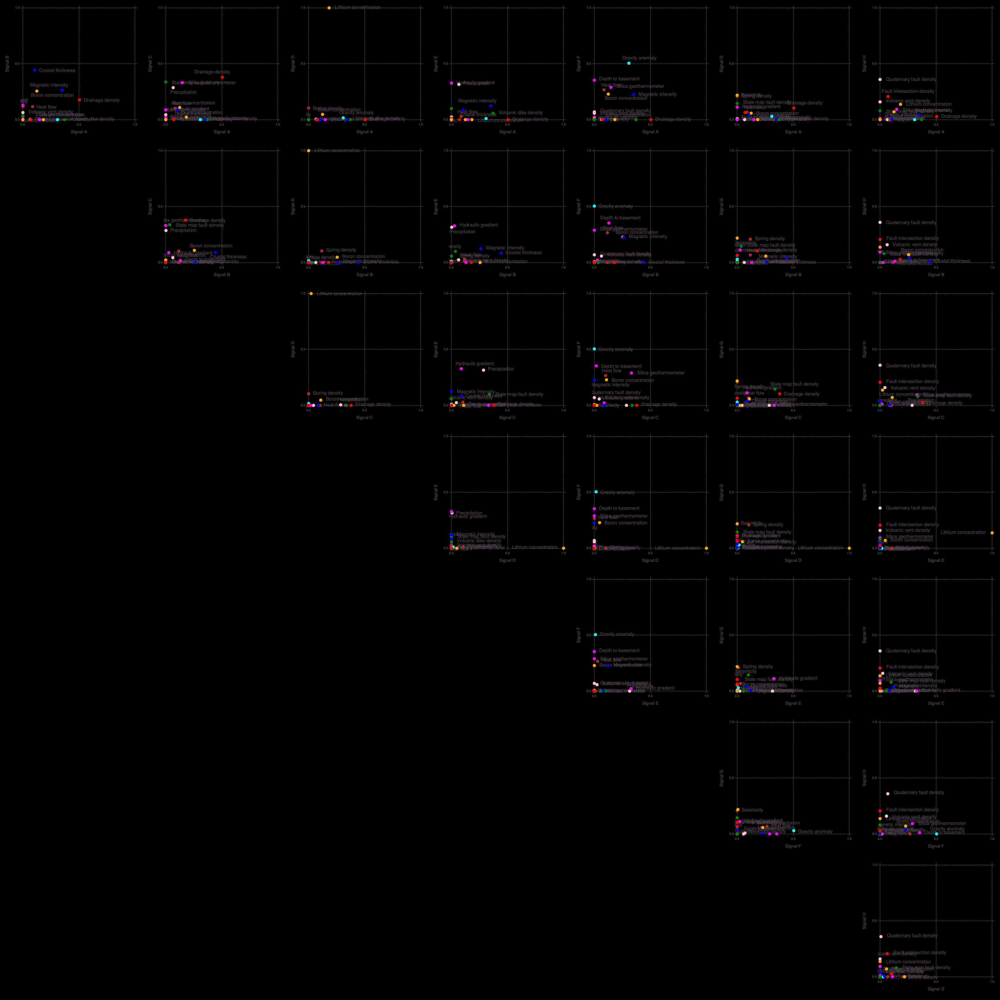

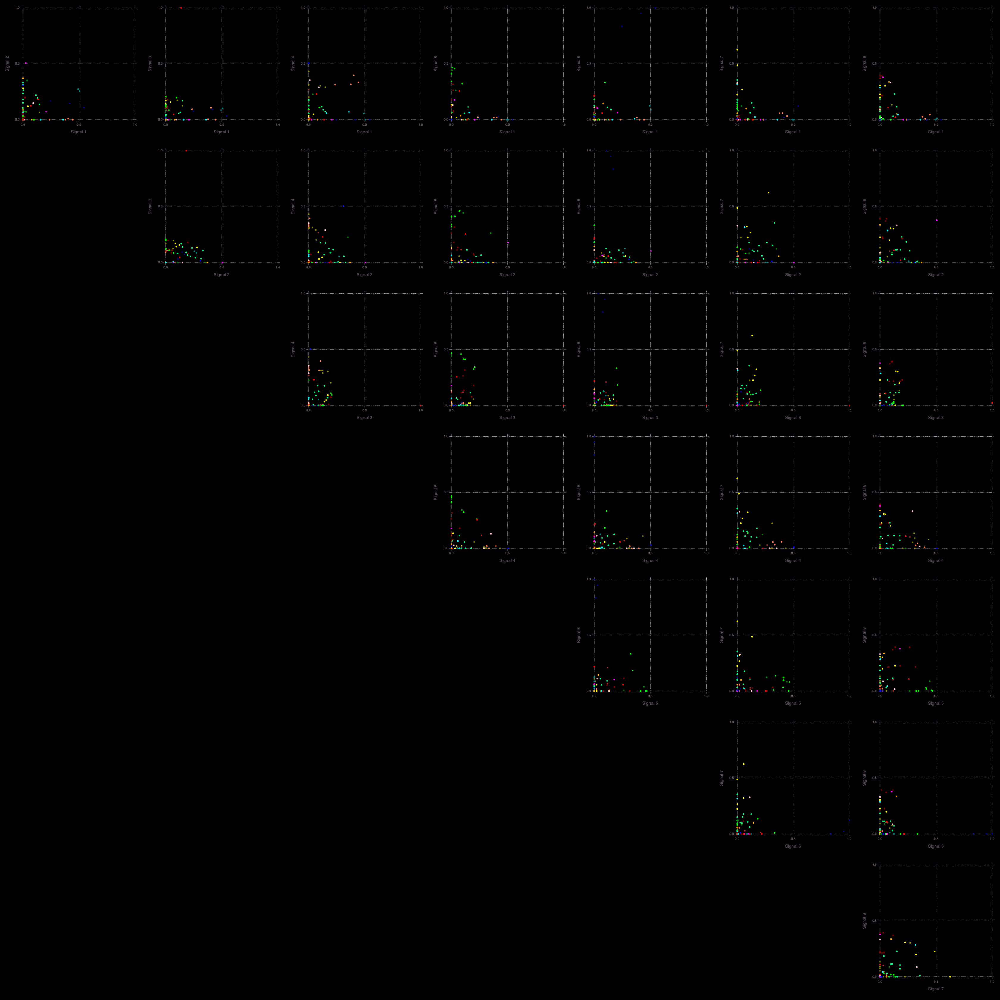

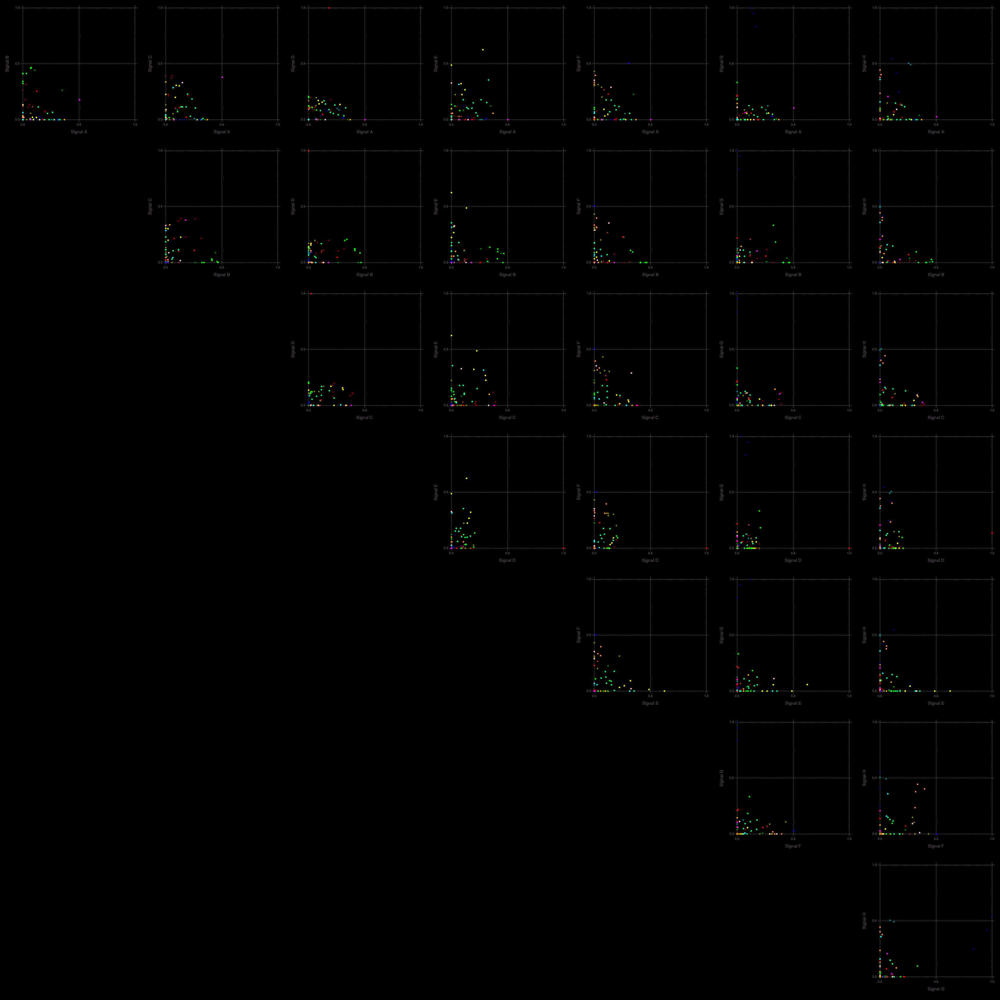

In [15]:
NMFk.clusterresults(NMFk.getks(nkrange, robustness[nkrange]), W, H, attributes, locations; lat=lat, lon=lon, resultdir=resultdir, figuredir=figuredir, Hcasefilename="locations", Wcasefilename="attributes");

The results for a solution with **5** signatures presented above will be further discussed here.

The geothermal attributes are clustered into **5** groups:

<div style="background-color: gray;">
    <iframe src="../results-case01/attributes-5-groups.txt" frameborder="0" height="400"
      width="95%"></iframe>
</div>

This grouping is based on analyses of the attribute matrix `W`:

![attributes-3-labeled-sorted](../figures-case01/attributes-5-labeled-sorted.png)

The well locations are also clustered into **3** groups:

<div style="background-color: gray;">
  <p>
    <iframe src="../results-case01/locations-5-groups.txt" frameborder="0" height="400"
      width="95%"></iframe>
  </p>
</div>

This grouping is based on analyses of the location matrix `H`:

![locations-3-labeled-sorted](../figures-case01/locations-5-labeled-sorted.png)


Spatial association of the extracted signatures with the four physiographic provinces in SWNM is summarized here:

![signatures](../figures-case01/signatures.png)

Clearly, the ML algorithm was able to blindly indentify the physiographic provinces associated with analyzed  hydrogeothermal systems without providing any information about their location (coordinates). 